In [1]:
# Data manipulation
import pandas as pd
import numpy as np

# Visualization
import matplotlib.pyplot as plt
import seaborn as sns

# Machine learning
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, accuracy_score
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.cluster import KMeans

# XGBoost
from xgboost import XGBRegressor, XGBClassifier
import xgboost as xgb

# Date and time manipulation
from datetime import timedelta
import time

# Parsing
import ast


# Main Functions

In [2]:
def top_correlated_features(df, target_feature, top_n=5):
    
    if target_feature not in df.columns:
        print(f"Target feature '{target_feature}' not found in the DataFrame.")
        return
    
    df = df.copy()
    
    correlations = df.corr(method='pearson')[target_feature].drop(target_feature)
    
    top_features = correlations.abs().nlargest(top_n).index.tolist()
    
    plt.figure(figsize=(10, 8))
    sns.heatmap(df.corr(method='pearson'), annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)
    plt.title('Feature Correlation Heatmap')
    plt.show()
    
    return top_features


In [3]:
def value_create_sub_dataframes(df, target_feature, num_groups=10):

    if target_feature not in df.columns:
        raise ValueError(f"Target feature '{target_feature}' not found in the DataFrame.")
    
    df_sorted = df.sort_values(by=target_feature).reset_index(drop=True)
    
    group_size = len(df_sorted) // num_groups
    remainder = len(df_sorted) % num_groups
    
    sub_dataframes = []
    start_index = 0
    
    for i in range(num_groups):

        end_index = start_index + group_size + (1 if i < remainder else 0)
        sub_dataframes.append(df_sorted.iloc[start_index:end_index])
        start_index = end_index
    
    return sub_dataframes


In [4]:
def user_create_sub_dataframes(df, target_feature):

    if target_feature not in df.columns:
        raise ValueError(f"Target feature '{target_feature}' not found in the DataFrame.")
    
    sub_dataframes = {value: df[df[target_feature] == value] for value in df[target_feature].unique()}

    
    return sub_dataframes


In [5]:
def cluster_create_sub_dataframes(df, selected_features, target_feature, n_clusters):

    if not all(feature in df.columns for feature in selected_features):
        missing_features = [feature for feature in selected_features if feature not in df.columns]
        raise ValueError(f"The following features are not in the DataFrame: {missing_features}")
    

    feature_data = df[selected_features]
    feature_data.replace([np.inf, -np.inf], np.nan, inplace=True)
    
    if feature_data.isnull().any().any():
        feature_data.fillna(feature_data.mean(), inplace=True)  # Fill NaN with column means
    
    # Ensure numerical data
    if not all(pd.api.types.is_numeric_dtype(feature_data[col]) for col in feature_data.columns):
        raise ValueError("All selected features must be numeric for clustering.")
    
    kmeans = KMeans(n_clusters=n_clusters, random_state=42)
    feature_data_scaled = feature_data.values 
    df['cluster'] = kmeans.fit_predict(feature_data_scaled)
    
    sub_dataframes = [df[df['cluster'] == cluster].drop(columns=['cluster']) for cluster in range(n_clusters)]
    
    return sub_dataframes

In [6]:
def train_xgboost(df, df_name, target_feature, train_features, requested_feature, random_state=42):

    if target_feature not in df.columns:
        raise ValueError(f"Target feature '{target_feature}' not found in the DataFrame.")
    
    df['lagged_target'] = df[target_feature].shift(3)
    df = df.dropna() 
    
    # adding the lagged version of target feature. right now the shift value is 1!!!
    if 'lagged_target' not in train_features:
        features_with_lag = train_features + ['lagged_target']
    else:
        features_with_lag = train_features
    
    X = df[features_with_lag]
    y = df[target_feature]
    requested_values = df[requested_feature]

    if len(X) < 2:  # If there's only one sample or fewer, splitting is not possible
        print(f"Warning: Not enough data in {df_name} to perform train-test split. Returning NaN for RMSE.")
        return 0
    
    
    test_size = 0.2
    X_train, X_test, y_train, y_test, req_train, req_test = train_test_split(X, y, requested_values, test_size=test_size, random_state=random_state)

    model = XGBRegressor(random_state=random_state)
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)

    mse = mean_squared_error(y_test, y_pred)
    rmse = np.sqrt(mse)

    def random_color():
        return np.random.rand(3,)

    color_actual_vs_requested = random_color()
    color_actual_vs_predicted = random_color()
    color_perfect_line = random_color()

    plt.figure(figsize=(10, 6))
    plt.scatter(y_test, req_test, label='User Requested Values', color=color_actual_vs_requested, alpha=0.7)
    plt.scatter(y_test, y_pred, label='XGBoost Predicted Values', color=color_actual_vs_predicted, alpha=0.7, marker='x')
    plt.plot(y_test, y_test, label='Perfect Prediction Line', color=color_perfect_line, linestyle='--', alpha=1)
    plt.xlabel('Actual Running Time (sec)')
    plt.ylabel('Requested/Predicted Running Time (sec)')
    plt.title(f'Comparison of Requested and Predicted {target_feature} on {df_name}')
    plt.legend()
    plt.grid(True)
    plt.show()

    return rmse

In [7]:
def single_model_train(df, df_name, target_feature, requested_feature, num_groups=10, top_n=5):

    top_features_global = top_correlated_features(df, target_feature, top_n)
    print(f"Top correlated features globally: {top_features_global}")
    rmse = train_xgboost(df, df_name, target_feature, top_features_global, requested_feature)
    print(f"Global RMSE (rmse_1): {rmse:.4f}")



In [8]:
def value_method_train(df, df_name, target_feature, requested_feature, num_groups=10, top_n=5):
    sub_dfs = value_create_sub_dataframes(df, target_feature, num_groups)
    rmse_list = []
    for i, sub_df in enumerate(sub_dfs):
        top_features_sub = top_correlated_features(sub_df, target_feature, top_n)
        print(f"Top features for subgroup {i + 1} (Value Grouping): {top_features_sub}")
        rmse_list.append(train_xgboost(sub_df,df_name, target_feature, top_features_sub, requested_feature))
    rmse = np.mean(rmse_list)
    print(f"Average RMSE for Value Grouping: {rmse:.4f}")




In [9]:
def user_method_train(df, df_name, target_feature, select_feature, requested_feature, top_n=5):
    sub_dfs = user_create_sub_dataframes(df, select_feature)
    rmse_list = []
    for i, (key, sub_df) in enumerate(sub_dfs.items()):
        # Make sure sub_df is a DataFrame
        if not isinstance(sub_df, pd.DataFrame):
            print(f"Warning: Sub-DataFrame for key {key} is not a DataFrame.")
            continue
        
        top_features_sub = top_correlated_features(sub_df, target_feature, top_n)
        print(f"Top features for subgroup {i + 1} (User Grouping): {top_features_sub}")
        rmse_list.append(train_xgboost(sub_df, df_name, target_feature, top_features_sub, requested_feature))
    
    rmse = np.mean(rmse_list)
    print(f"Average RMSE for User Grouping: {rmse:.4f}")




In [10]:
def cluster_method_train(df, df_name, selected_features, target_feature, requested_feature, num_groups=10, top_n=5):
    
    sub_dfs = cluster_create_sub_dataframes(df, selected_features, target_feature, num_groups)
    rmse_list = []
    
    for i, sub_df in enumerate(sub_dfs):
        top_features_sub = top_correlated_features(sub_df, target_feature, top_n)
        print(f"Top features for subgroup {i + 1} (Clustering): {top_features_sub}")
        rmse_list.append(train_xgboost(sub_df, df_name, target_feature, top_features_sub, requested_feature))
    rmse = np.mean(rmse_list)
    print(f"Average RMSE for Clustering: {rmse:.4f}")




# NREL Dataset

In [11]:
file_path = "/projectnb/peaclab-mon/boztop/resource-allocation/datasets/nrel-eagle/eagle_data.csv.bz2"
df = pd.read_csv(file_path, compression='bz2')

df['start_time'] = pd.to_datetime(df['start_time'])
df['submit_time'] = pd.to_datetime(df['submit_time'])
df['end_time'] = pd.to_datetime(df['end_time'])

nrel_df = df[df['state'] == 'COMPLETED']

print(nrel_df.columns)

Index(['job_id', 'user', 'account', 'partition', 'qos', 'wallclock_req',
       'nodes_req', 'processors_req', 'gpus_req', 'mem_req', 'submit_time',
       'start_time', 'end_time', 'run_time', 'state', 'name', 'work_dir',
       'submit_line'],
      dtype='object')


In [ ]:
for col in ['job_id', 'user', 'account', 'partition', 'qos', 'name', 'work_dir','submit_line']:
    print(f'Encoding the feature {col}')
    le = LabelEncoder()
    nrel_df[col] = le.fit_transform(nrel_df[col].astype(str))

Encoding the feature job_id


In [25]:
start_time = time.time()

cluster_method_train(nrel_df, 'NREL Dataset', ['job_id', 'user', 'account','wallclock_req',
       'nodes_req', 'processors_req', 'gpus_req', 'mem_req'],'run_time', 'wallclock_req', num_groups=10, top_n=5)

end_time = time.time()

elapsed_time = end_time - start_time
print(f"Cluster method took {elapsed_time:.2f} seconds to execute.")

/project/peaclab-mon/monitoring_venv/lib/python3.6/site-packages/pandas/core/frame.py:4389: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  method=method,
/project/peaclab-mon/monitoring_venv/lib/python3.6/site-packages/pandas/core/series.py:4536: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  downcast=downcast,


KeyboardInterrupt: 

Exception ignored in: 'sklearn.cluster._k_means_fast._relocate_empty_clusters_dense'
Traceback (most recent call last):
  File "<__array_function__ internals>", line 2, in where
KeyboardInterrupt


KeyboardInterrupt: 

Exception ignored in: 'sklearn.cluster._k_means_fast._relocate_empty_clusters_dense'
Traceback (most recent call last):
  File "<__array_function__ internals>", line 2, in where
KeyboardInterrupt


KeyboardInterrupt: 

In [ ]:
start_time = time.time()

single_model_train(nrel_df, 'NREL Dataset', 'run_time', 'wallclock_req', num_groups=10, top_n=5)
    
end_time = time.time()

elapsed_time = end_time - start_time
print(f"Single model took {elapsed_time:.2f} seconds to execute.")

In [ ]:
run_time = nrel_df['run_time'].replace([np.inf, -np.inf], np.nan).dropna()
wallclock_req = nrel_df['wallclock_req'].replace([np.inf, -np.inf], np.nan).dropna()

aligned = run_time.align(wallclock_req, join='inner')
run_time, wallclock_req = aligned[0], aligned[1]

errors = run_time - wallclock_req
mse = np.mean(errors ** 2)  # Mean Squared Error
rmse = np.sqrt(mse)         # Root Mean Squared Error

print(f"Root Mean Squared Error (RMSE): {rmse}")

# Fugaku Dataset

In [11]:
directory = '/projectnb/peaclab-mon/boztop/resource-allocation/datasets/fugaku/24_04.parquet'
df = pd.read_parquet(directory)
fugaku_df = df[df['exit state'] == 'completed']
print(fugaku_df.columns)



Index(['jid', 'usr', 'jnam', 'cnumr', 'cnumat', 'cnumut', 'nnumr', 'adt',
       'qdt', 'schedsdt', 'deldt', 'ec', 'elpl', 'sdt', 'edt', 'nnuma',
       'idle_time_ave', 'nnumu', 'perf1', 'perf2', 'perf3', 'perf4', 'perf5',
       'perf6', 'mszl', 'pri', 'econ', 'avgpcon', 'minpcon', 'maxpcon', 'msza',
       'mmszu', 'uctmut', 'sctmut', 'usctmut', 'jobenv_req', 'freq_req',
       'freq_alloc', 'flops', 'mbwidth', 'opint', 'pclass', 'embedding',
       'exit state', 'duration'],
      dtype='object')


In [12]:
for col in ['jid', 'usr', 'jnam', 'adt','qdt', 'schedsdt', 'deldt', 'sdt', 'edt',
            'jobenv_req',  'pclass']:
    print(f'Encoding the feature {col}')
    le = LabelEncoder()
    fugaku_df[col] = le.fit_transform(fugaku_df[col].astype(str))

Encoding the feature jid


/project/peaclab-mon/monitoring_venv/lib/python3.6/site-packages/ipykernel_launcher.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """


Encoding the feature usr
Encoding the feature jnam
Encoding the feature adt
Encoding the feature qdt
Encoding the feature schedsdt
Encoding the feature deldt
Encoding the feature sdt
Encoding the feature edt
Encoding the feature jobenv_req
Encoding the feature pclass


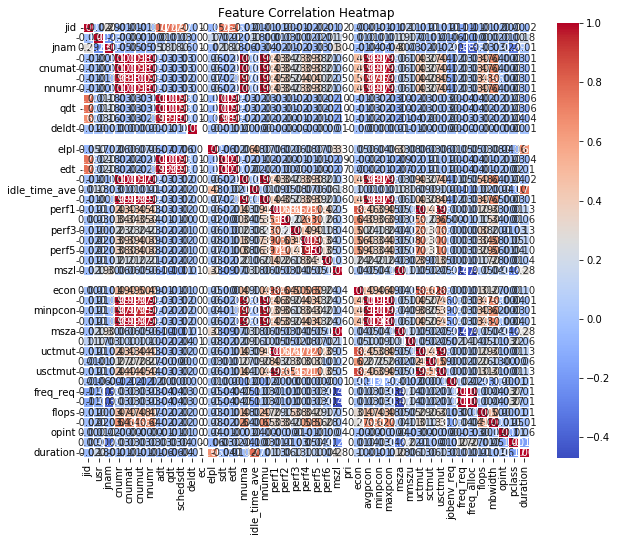

Top correlated features globally: ['idle_time_ave', 'elpl', 'mszl', 'msza', 'usr']


/project/peaclab-mon/monitoring_venv/lib/python3.6/site-packages/ipykernel_launcher.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/project/peaclab-mon/monitoring_venv/lib/python3.6/site-packages/matplotlib/cbook/__init__.py:1402: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  x[:, None]
/project/peaclab-mon/monitoring_venv/lib/python3.6/site-packages/matplotlib/axes/_base.py:276: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  x = x[:, np.newaxis]
/project/peaclab-mon/mon

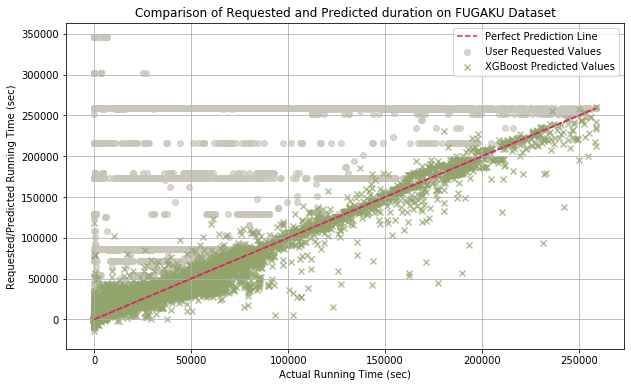

Global RMSE (rmse_1): 4118.9293
Single model took 20.64 seconds to execute.


In [13]:
start_time = time.time()
single_model_train(fugaku_df, 'FUGAKU Dataset', 'duration', 'elpl', num_groups=10, top_n=5)

end_time = time.time()

elapsed_time = end_time - start_time
print(f"Single model took {elapsed_time:.2f} seconds to execute.")

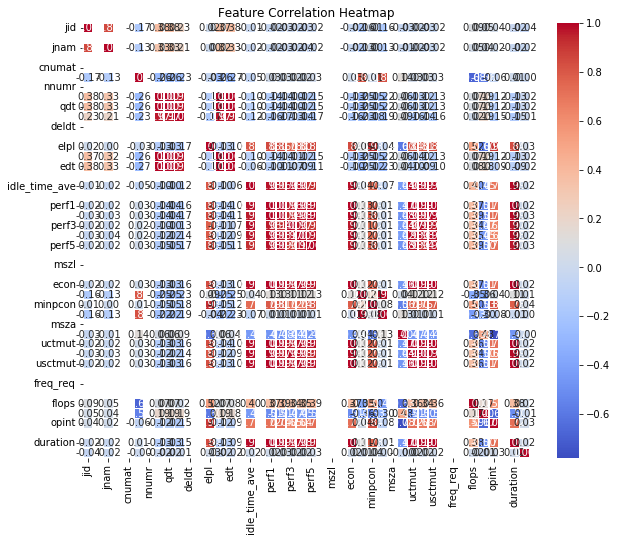

Top features for subgroup 1 (User Grouping): ['usctmut', 'uctmut', 'econ', 'perf1', 'sctmut']


/project/peaclab-mon/monitoring_venv/lib/python3.6/site-packages/ipykernel_launcher.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/project/peaclab-mon/monitoring_venv/lib/python3.6/site-packages/matplotlib/cbook/__init__.py:1402: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  x[:, None]
/project/peaclab-mon/monitoring_venv/lib/python3.6/site-packages/matplotlib/axes/_base.py:276: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  x = x[:, np.newaxis]
/project/peaclab-mon/mon

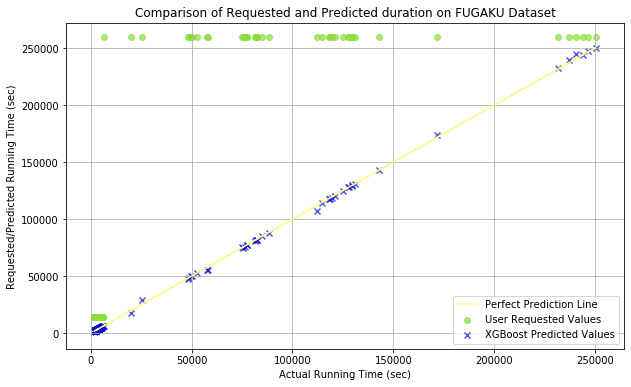

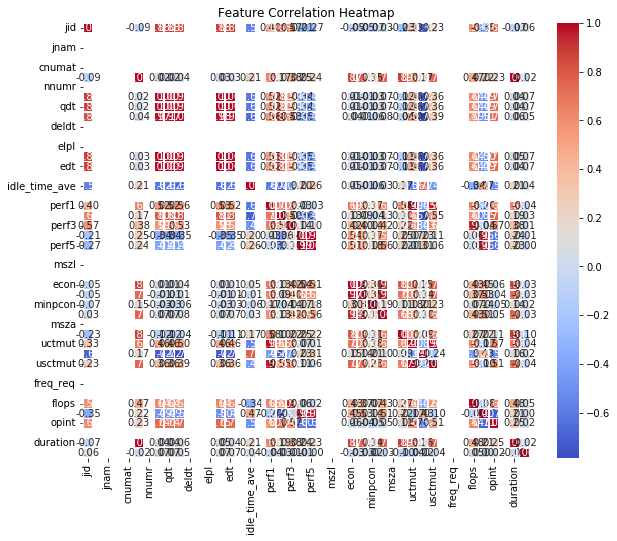

Top features for subgroup 2 (User Grouping): ['cnumut', 'mmszu', 'econ', 'usctmut', 'maxpcon']


/project/peaclab-mon/monitoring_venv/lib/python3.6/site-packages/ipykernel_launcher.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/project/peaclab-mon/monitoring_venv/lib/python3.6/site-packages/matplotlib/cbook/__init__.py:1402: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  x[:, None]
/project/peaclab-mon/monitoring_venv/lib/python3.6/site-packages/matplotlib/axes/_base.py:276: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  x = x[:, np.newaxis]
/project/peaclab-mon/mon

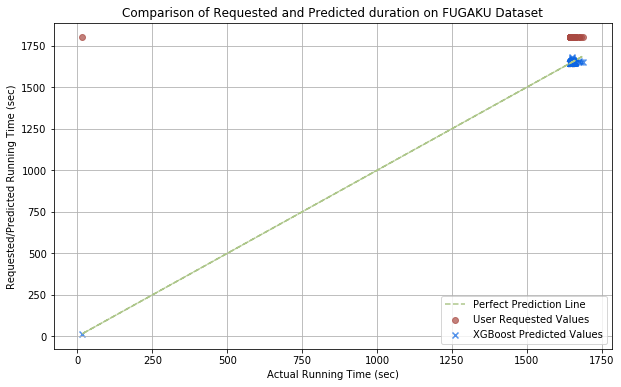

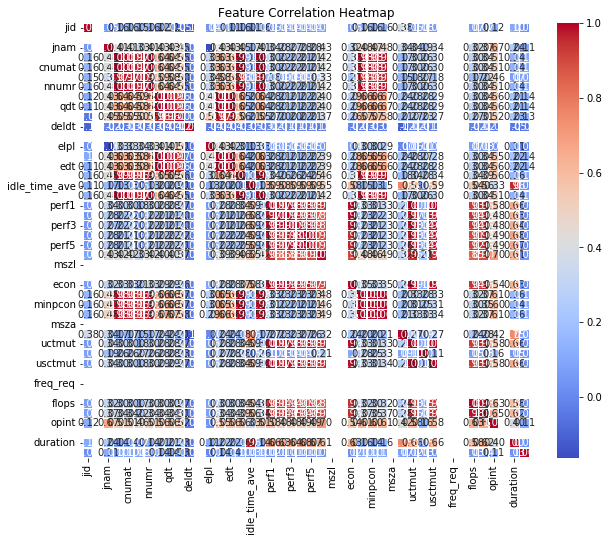

Top features for subgroup 3 (User Grouping): ['idle_time_ave', 'mmszu', 'perf4', 'perf5', 'uctmut']


/project/peaclab-mon/monitoring_venv/lib/python3.6/site-packages/ipykernel_launcher.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/project/peaclab-mon/monitoring_venv/lib/python3.6/site-packages/matplotlib/cbook/__init__.py:1402: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  x[:, None]
/project/peaclab-mon/monitoring_venv/lib/python3.6/site-packages/matplotlib/axes/_base.py:276: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  x = x[:, np.newaxis]
/project/peaclab-mon/mon

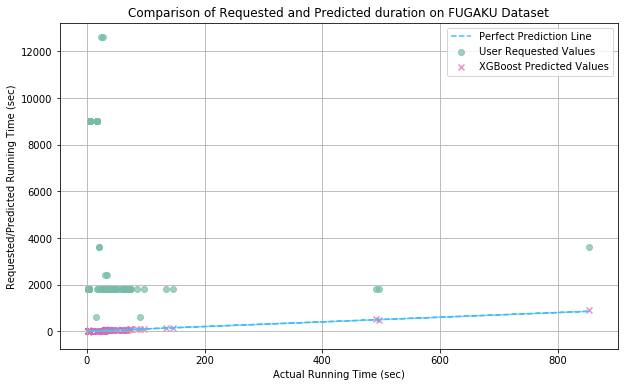

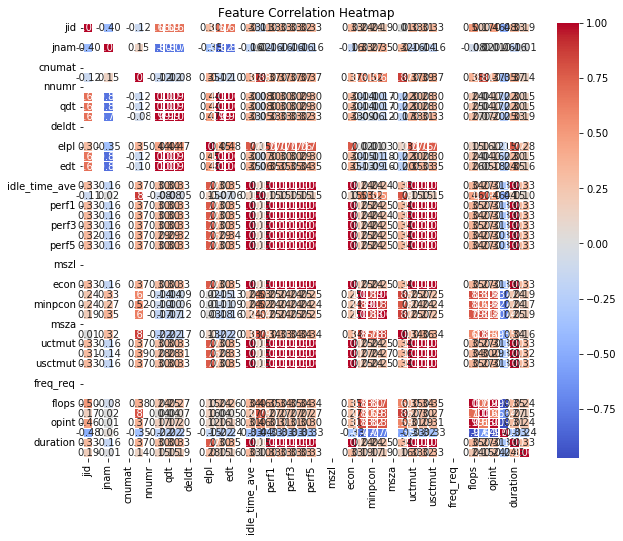

Top features for subgroup 4 (User Grouping): ['idle_time_ave', 'uctmut', 'usctmut', 'perf2', 'perf5']


/project/peaclab-mon/monitoring_venv/lib/python3.6/site-packages/ipykernel_launcher.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/project/peaclab-mon/monitoring_venv/lib/python3.6/site-packages/matplotlib/cbook/__init__.py:1402: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  x[:, None]
/project/peaclab-mon/monitoring_venv/lib/python3.6/site-packages/matplotlib/axes/_base.py:276: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  x = x[:, np.newaxis]
/project/peaclab-mon/mon

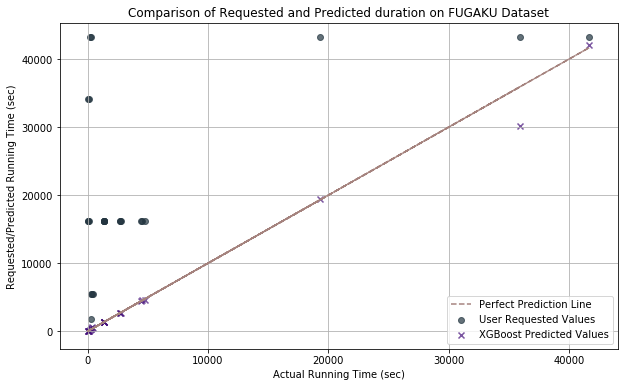

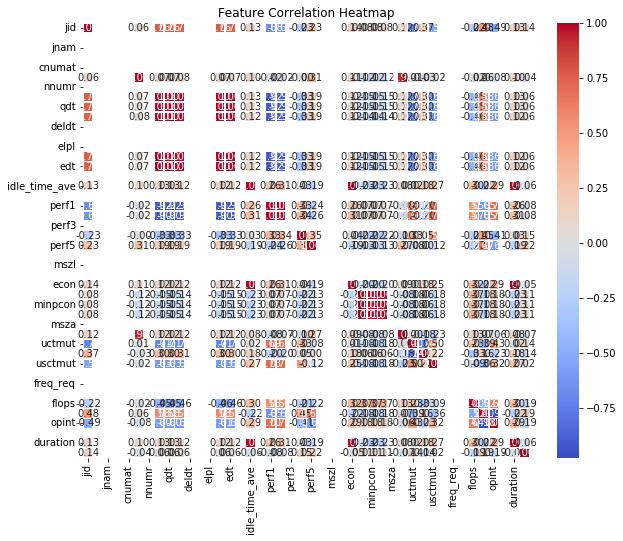

Top features for subgroup 5 (User Grouping): ['idle_time_ave', 'econ', 'perf2', 'flops', 'opint']


/project/peaclab-mon/monitoring_venv/lib/python3.6/site-packages/ipykernel_launcher.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/project/peaclab-mon/monitoring_venv/lib/python3.6/site-packages/matplotlib/cbook/__init__.py:1402: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  x[:, None]
/project/peaclab-mon/monitoring_venv/lib/python3.6/site-packages/matplotlib/axes/_base.py:276: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  x = x[:, np.newaxis]
/project/peaclab-mon/mon

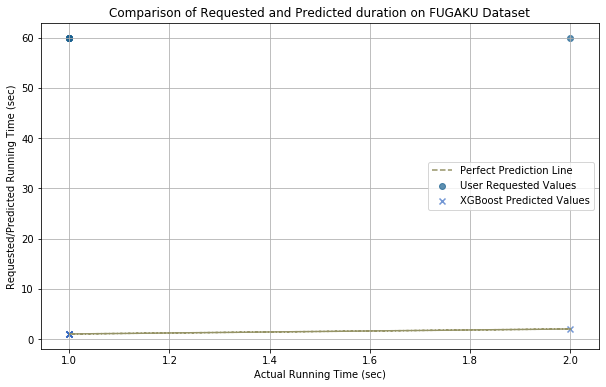

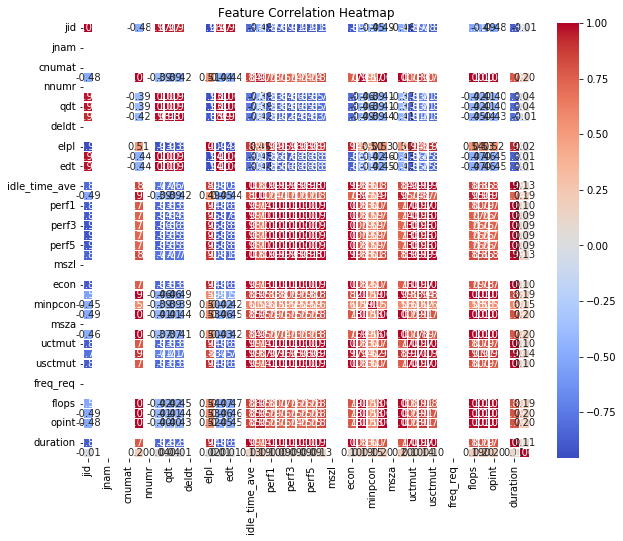

Top features for subgroup 6 (User Grouping): ['usctmut', 'perf1', 'uctmut', 'econ', 'perf2']


/project/peaclab-mon/monitoring_venv/lib/python3.6/site-packages/ipykernel_launcher.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/project/peaclab-mon/monitoring_venv/lib/python3.6/site-packages/matplotlib/cbook/__init__.py:1402: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  x[:, None]
/project/peaclab-mon/monitoring_venv/lib/python3.6/site-packages/matplotlib/axes/_base.py:276: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  x = x[:, np.newaxis]
/project/peaclab-mon/mon

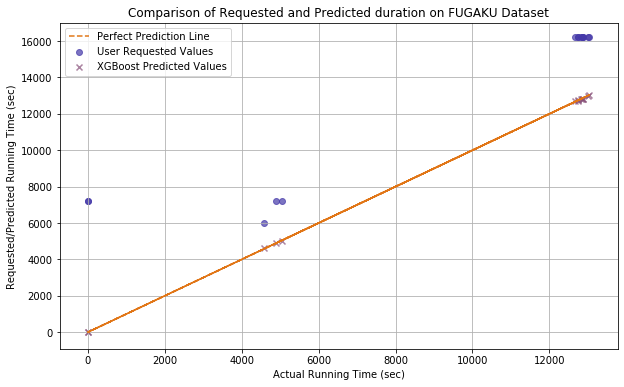

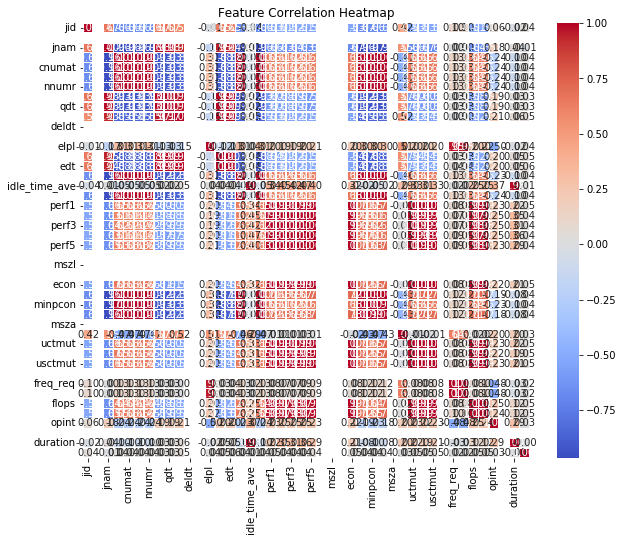

Top features for subgroup 7 (User Grouping): ['idle_time_ave', 'perf4', 'perf2', 'perf3', 'opint']


/project/peaclab-mon/monitoring_venv/lib/python3.6/site-packages/ipykernel_launcher.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/project/peaclab-mon/monitoring_venv/lib/python3.6/site-packages/matplotlib/cbook/__init__.py:1402: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  x[:, None]
/project/peaclab-mon/monitoring_venv/lib/python3.6/site-packages/matplotlib/axes/_base.py:276: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  x = x[:, np.newaxis]
/project/peaclab-mon/mon

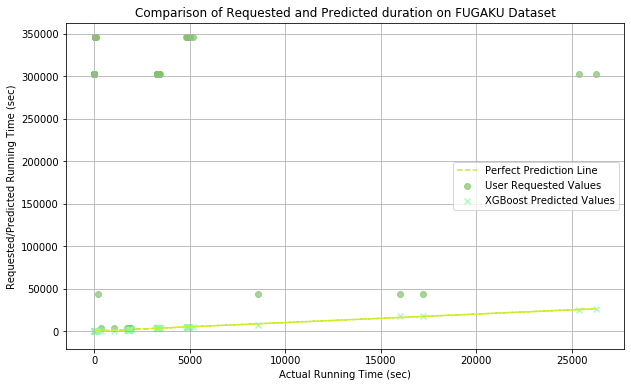

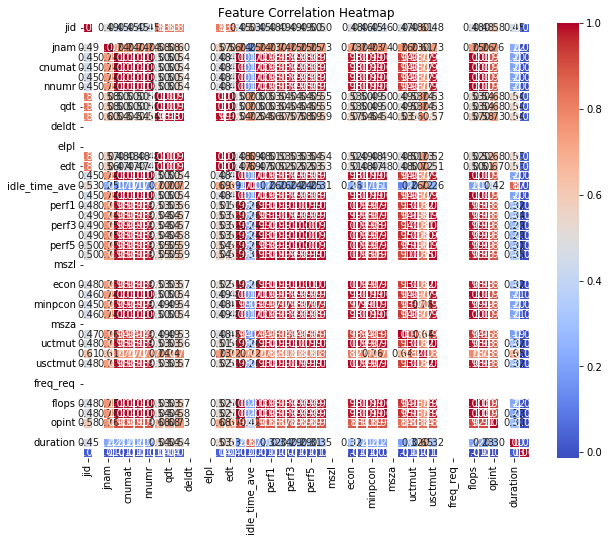

Top features for subgroup 8 (User Grouping): ['idle_time_ave', 'sctmut', 'adt', 'qdt', 'schedsdt']


/project/peaclab-mon/monitoring_venv/lib/python3.6/site-packages/ipykernel_launcher.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/project/peaclab-mon/monitoring_venv/lib/python3.6/site-packages/matplotlib/cbook/__init__.py:1402: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  x[:, None]
/project/peaclab-mon/monitoring_venv/lib/python3.6/site-packages/matplotlib/axes/_base.py:276: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  x = x[:, np.newaxis]
/project/peaclab-mon/mon

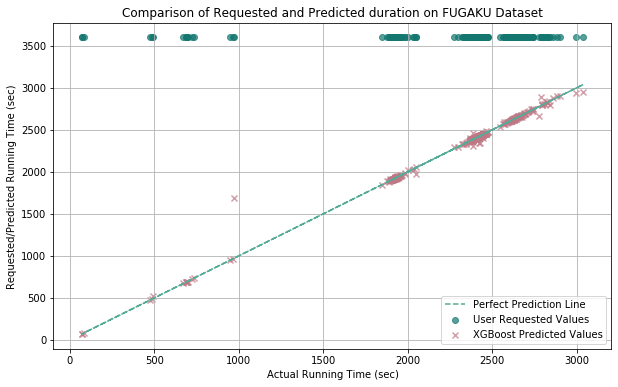

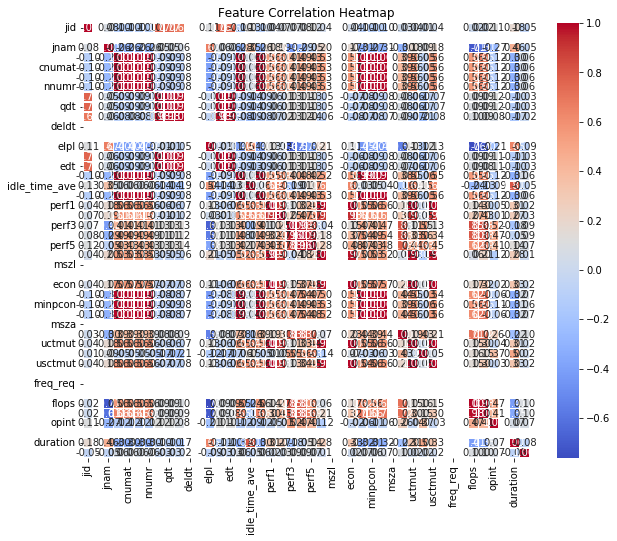

Top features for subgroup 9 (User Grouping): ['idle_time_ave', 'elpl', 'sctmut', 'jnam', 'flops']


/project/peaclab-mon/monitoring_venv/lib/python3.6/site-packages/ipykernel_launcher.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/project/peaclab-mon/monitoring_venv/lib/python3.6/site-packages/matplotlib/cbook/__init__.py:1402: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  x[:, None]
/project/peaclab-mon/monitoring_venv/lib/python3.6/site-packages/matplotlib/axes/_base.py:276: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  x = x[:, np.newaxis]
/project/peaclab-mon/mon

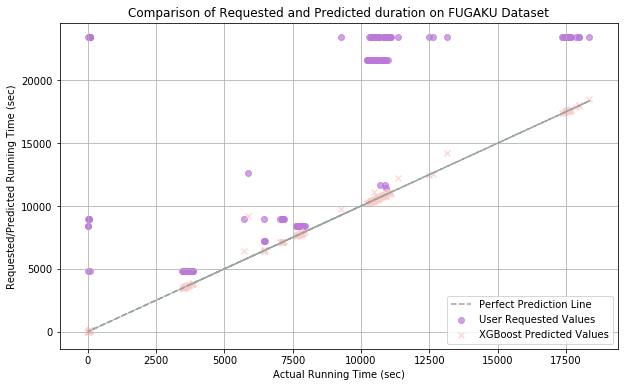

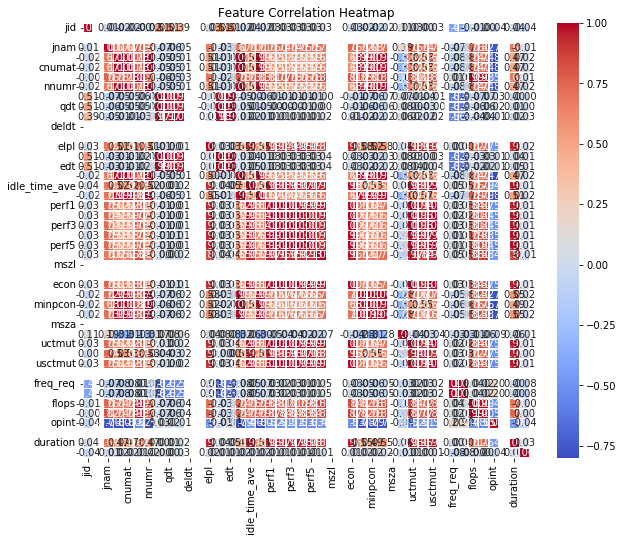

Top features for subgroup 10 (User Grouping): ['perf5', 'perf4', 'perf2', 'perf3', 'idle_time_ave']


/project/peaclab-mon/monitoring_venv/lib/python3.6/site-packages/ipykernel_launcher.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/project/peaclab-mon/monitoring_venv/lib/python3.6/site-packages/matplotlib/cbook/__init__.py:1402: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  x[:, None]
/project/peaclab-mon/monitoring_venv/lib/python3.6/site-packages/matplotlib/axes/_base.py:276: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  x = x[:, np.newaxis]
/project/peaclab-mon/mon

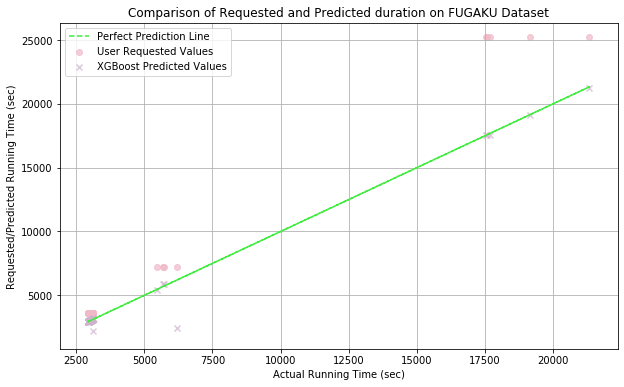

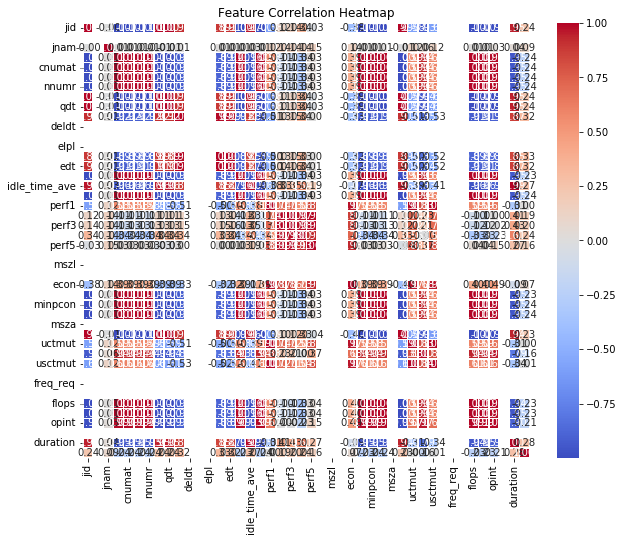

Top features for subgroup 11 (User Grouping): ['idle_time_ave', 'jid', 'minpcon', 'cnumr', 'cnumat']


/project/peaclab-mon/monitoring_venv/lib/python3.6/site-packages/ipykernel_launcher.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/project/peaclab-mon/monitoring_venv/lib/python3.6/site-packages/matplotlib/cbook/__init__.py:1402: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  x[:, None]
/project/peaclab-mon/monitoring_venv/lib/python3.6/site-packages/matplotlib/axes/_base.py:276: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  x = x[:, np.newaxis]
/project/peaclab-mon/mon

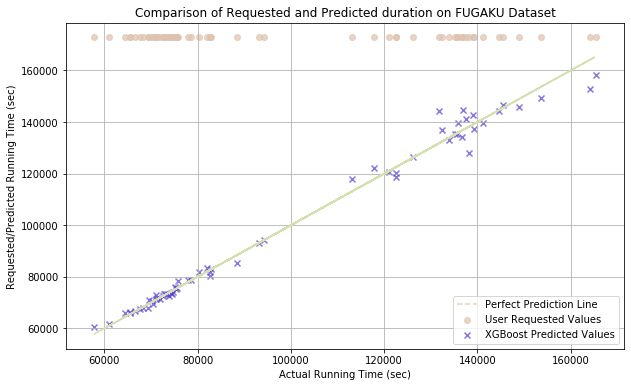

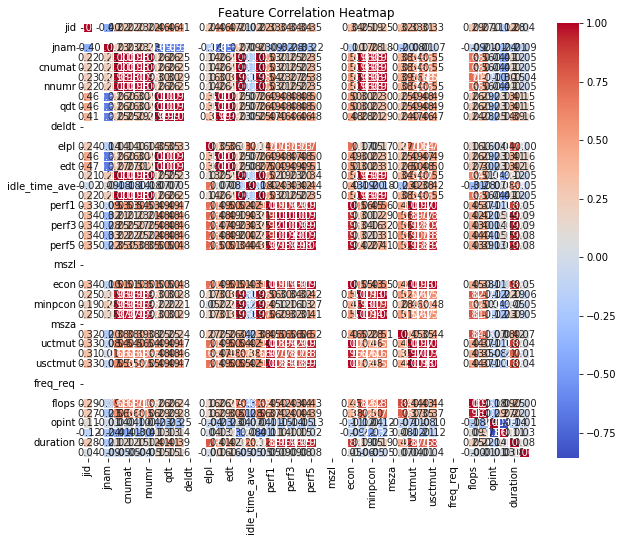

Top features for subgroup 12 (User Grouping): ['perf3', 'perf2', 'perf5', 'perf4', 'econ']


/project/peaclab-mon/monitoring_venv/lib/python3.6/site-packages/ipykernel_launcher.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/project/peaclab-mon/monitoring_venv/lib/python3.6/site-packages/matplotlib/cbook/__init__.py:1402: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  x[:, None]
/project/peaclab-mon/monitoring_venv/lib/python3.6/site-packages/matplotlib/axes/_base.py:276: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  x = x[:, np.newaxis]
/project/peaclab-mon/mon

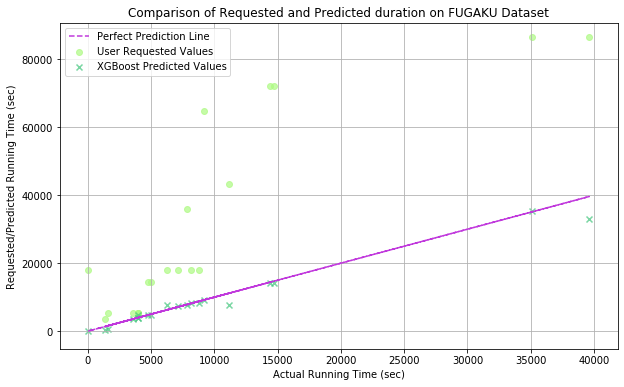

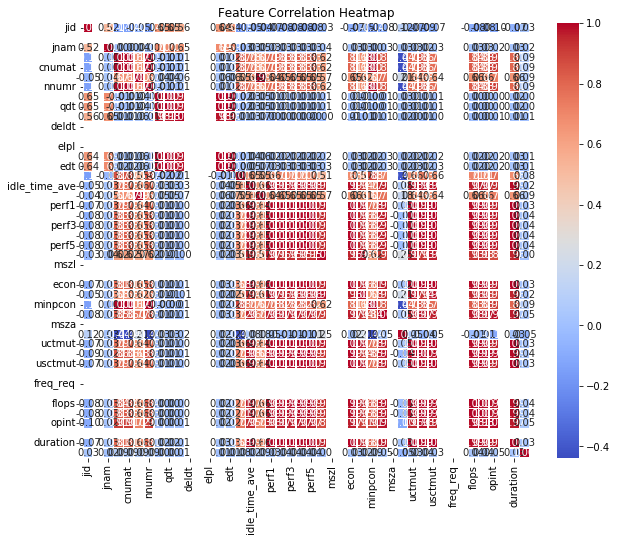

Top features for subgroup 13 (User Grouping): ['econ', 'usctmut', 'uctmut', 'perf1', 'perf5']


/project/peaclab-mon/monitoring_venv/lib/python3.6/site-packages/ipykernel_launcher.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/project/peaclab-mon/monitoring_venv/lib/python3.6/site-packages/matplotlib/cbook/__init__.py:1402: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  x[:, None]
/project/peaclab-mon/monitoring_venv/lib/python3.6/site-packages/matplotlib/axes/_base.py:276: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  x = x[:, np.newaxis]
/project/peaclab-mon/mon

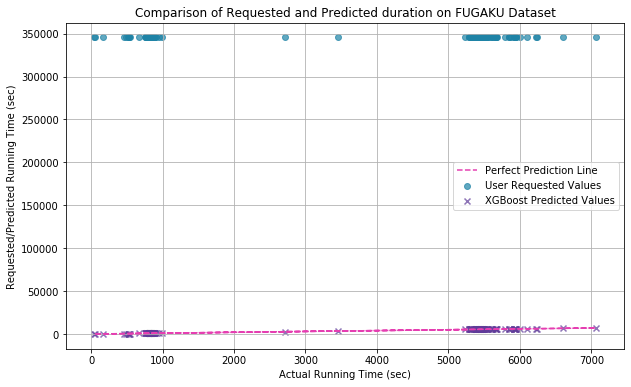

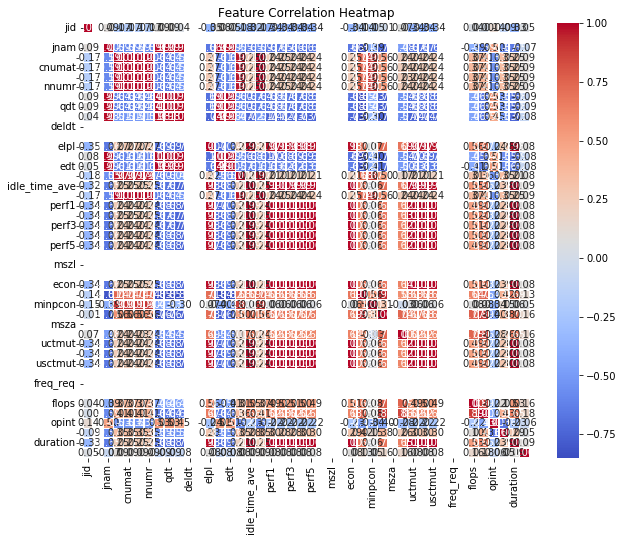

Top features for subgroup 14 (User Grouping): ['econ', 'idle_time_ave', 'perf2', 'perf3', 'perf4']


/project/peaclab-mon/monitoring_venv/lib/python3.6/site-packages/ipykernel_launcher.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/project/peaclab-mon/monitoring_venv/lib/python3.6/site-packages/matplotlib/cbook/__init__.py:1402: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  x[:, None]
/project/peaclab-mon/monitoring_venv/lib/python3.6/site-packages/matplotlib/axes/_base.py:276: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  x = x[:, np.newaxis]
/project/peaclab-mon/mon

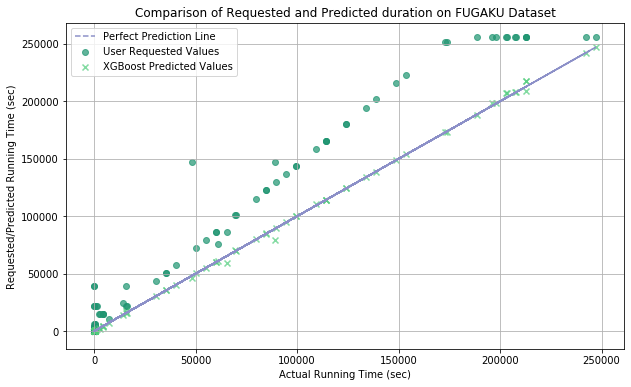

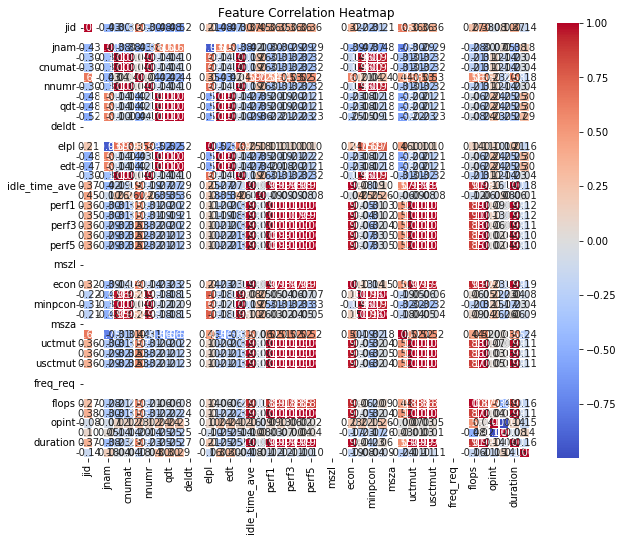

Top features for subgroup 15 (User Grouping): ['idle_time_ave', 'perf2', 'perf1', 'econ', 'uctmut']


/project/peaclab-mon/monitoring_venv/lib/python3.6/site-packages/ipykernel_launcher.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/project/peaclab-mon/monitoring_venv/lib/python3.6/site-packages/matplotlib/cbook/__init__.py:1402: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  x[:, None]
/project/peaclab-mon/monitoring_venv/lib/python3.6/site-packages/matplotlib/axes/_base.py:276: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  x = x[:, np.newaxis]
/project/peaclab-mon/mon

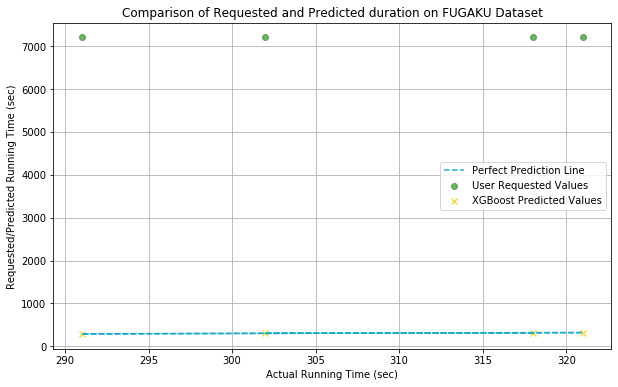

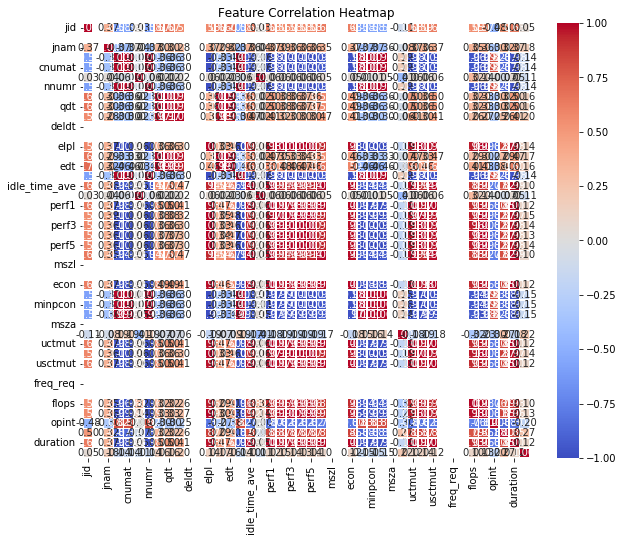

Top features for subgroup 16 (User Grouping): ['usctmut', 'uctmut', 'perf1', 'econ', 'idle_time_ave']


/project/peaclab-mon/monitoring_venv/lib/python3.6/site-packages/ipykernel_launcher.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/project/peaclab-mon/monitoring_venv/lib/python3.6/site-packages/matplotlib/cbook/__init__.py:1402: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  x[:, None]
/project/peaclab-mon/monitoring_venv/lib/python3.6/site-packages/matplotlib/axes/_base.py:276: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  x = x[:, np.newaxis]
/project/peaclab-mon/mon

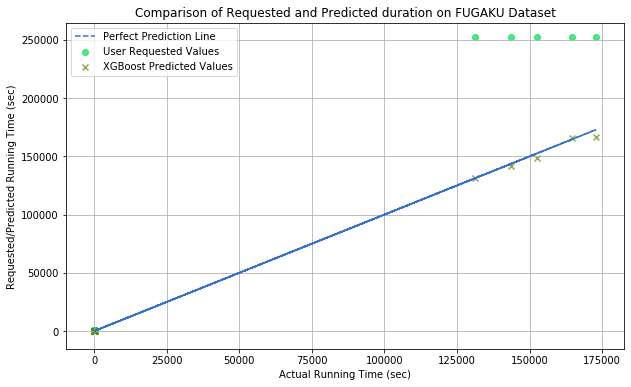

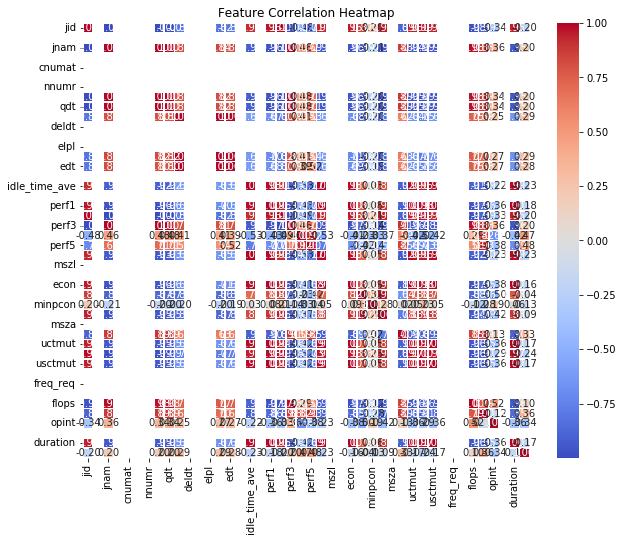

Top features for subgroup 17 (User Grouping): ['usctmut', 'uctmut', 'perf1', 'econ', 'perf6']


/project/peaclab-mon/monitoring_venv/lib/python3.6/site-packages/ipykernel_launcher.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/project/peaclab-mon/monitoring_venv/lib/python3.6/site-packages/matplotlib/cbook/__init__.py:1402: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  x[:, None]
/project/peaclab-mon/monitoring_venv/lib/python3.6/site-packages/matplotlib/axes/_base.py:276: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  x = x[:, np.newaxis]
/project/peaclab-mon/mon

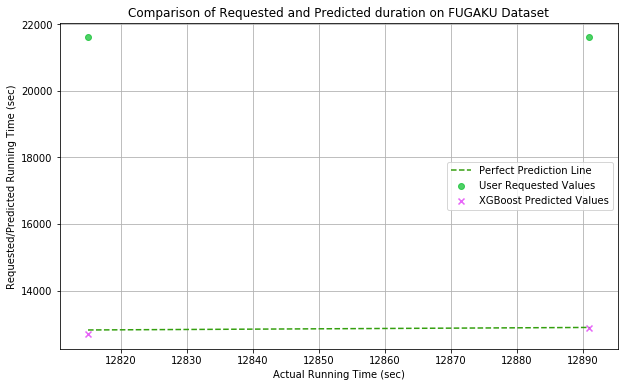

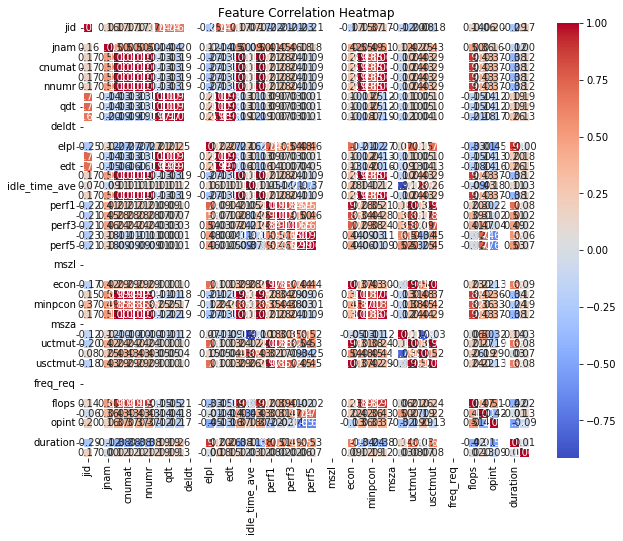

Top features for subgroup 18 (User Grouping): ['elpl', 'perf1', 'uctmut', 'usctmut', 'econ']


/project/peaclab-mon/monitoring_venv/lib/python3.6/site-packages/ipykernel_launcher.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/project/peaclab-mon/monitoring_venv/lib/python3.6/site-packages/matplotlib/cbook/__init__.py:1402: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  x[:, None]
/project/peaclab-mon/monitoring_venv/lib/python3.6/site-packages/matplotlib/axes/_base.py:276: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  x = x[:, np.newaxis]
/project/peaclab-mon/mon

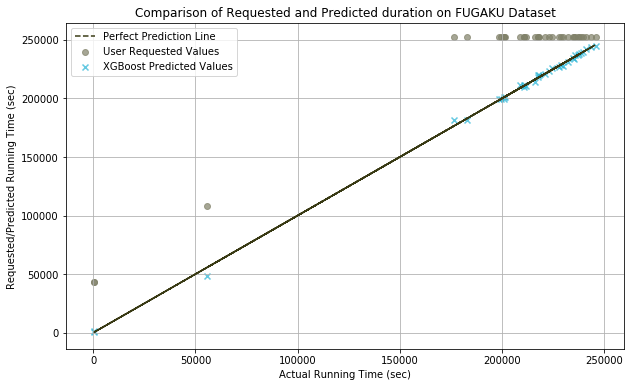

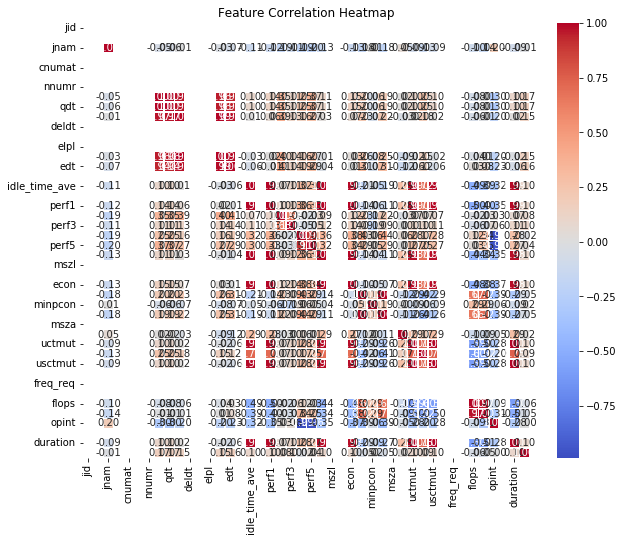

Top features for subgroup 19 (User Grouping): ['usctmut', 'uctmut', 'idle_time_ave', 'perf1', 'perf6']


/project/peaclab-mon/monitoring_venv/lib/python3.6/site-packages/ipykernel_launcher.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/project/peaclab-mon/monitoring_venv/lib/python3.6/site-packages/matplotlib/cbook/__init__.py:1402: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  x[:, None]
/project/peaclab-mon/monitoring_venv/lib/python3.6/site-packages/matplotlib/axes/_base.py:276: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  x = x[:, np.newaxis]
/project/peaclab-mon/mon

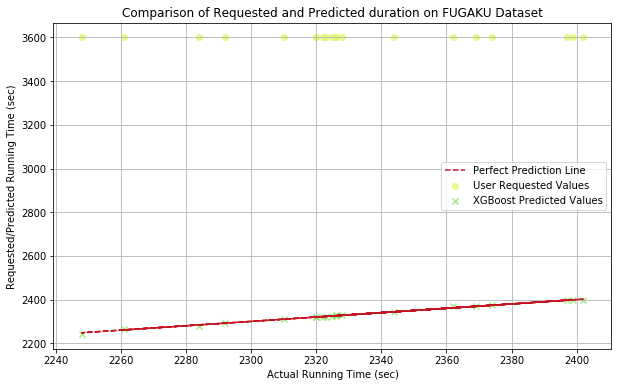

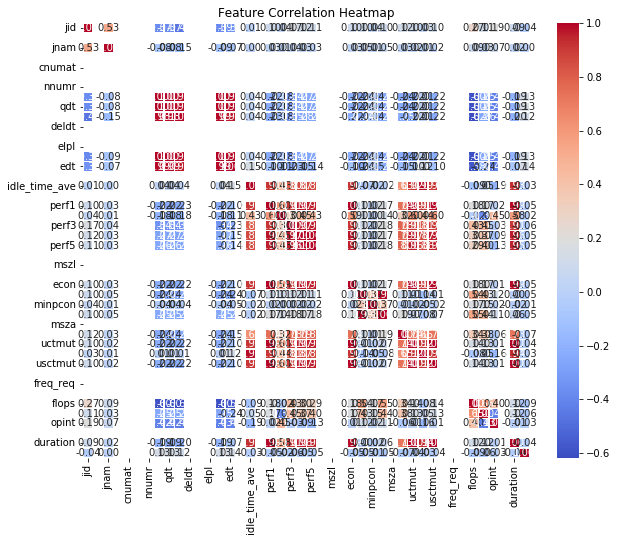

Top features for subgroup 20 (User Grouping): ['usctmut', 'uctmut', 'econ', 'perf1', 'perf4']


/project/peaclab-mon/monitoring_venv/lib/python3.6/site-packages/ipykernel_launcher.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/project/peaclab-mon/monitoring_venv/lib/python3.6/site-packages/matplotlib/cbook/__init__.py:1402: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  x[:, None]
/project/peaclab-mon/monitoring_venv/lib/python3.6/site-packages/matplotlib/axes/_base.py:276: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  x = x[:, np.newaxis]
/project/peaclab-mon/mon

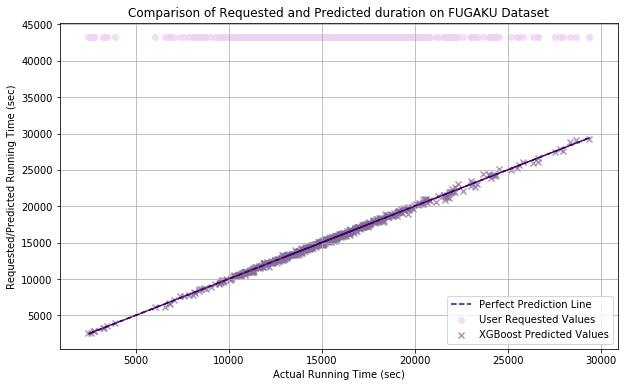

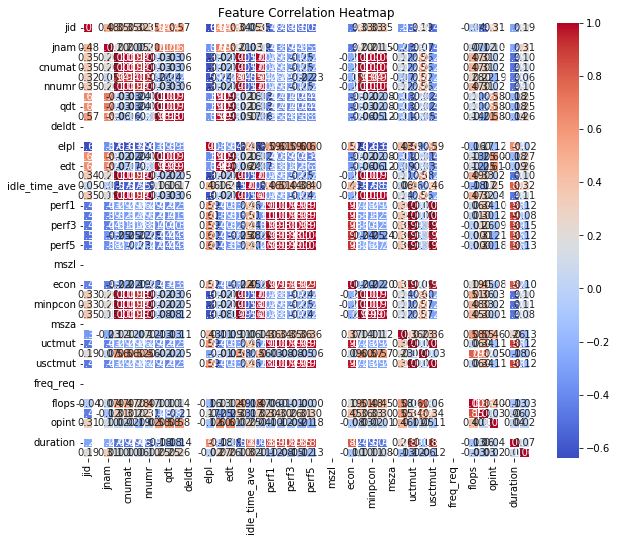

Top features for subgroup 21 (User Grouping): ['perf2', 'perf3', 'perf1', 'uctmut', 'usctmut']


/project/peaclab-mon/monitoring_venv/lib/python3.6/site-packages/ipykernel_launcher.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/project/peaclab-mon/monitoring_venv/lib/python3.6/site-packages/matplotlib/cbook/__init__.py:1402: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  x[:, None]
/project/peaclab-mon/monitoring_venv/lib/python3.6/site-packages/matplotlib/axes/_base.py:276: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  x = x[:, np.newaxis]
/project/peaclab-mon/mon

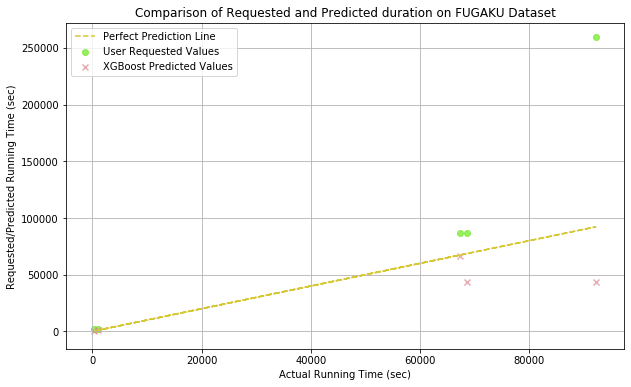

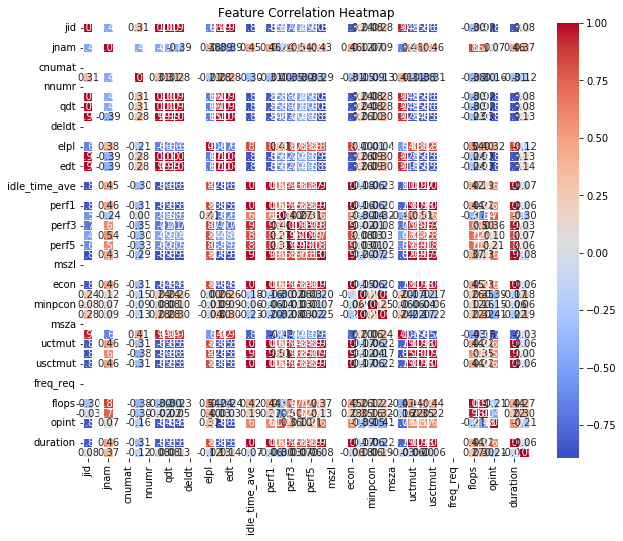

Top features for subgroup 22 (User Grouping): ['usctmut', 'uctmut', 'perf1', 'econ', 'idle_time_ave']


/project/peaclab-mon/monitoring_venv/lib/python3.6/site-packages/ipykernel_launcher.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/project/peaclab-mon/monitoring_venv/lib/python3.6/site-packages/matplotlib/cbook/__init__.py:1402: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  x[:, None]
/project/peaclab-mon/monitoring_venv/lib/python3.6/site-packages/matplotlib/axes/_base.py:276: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  x = x[:, np.newaxis]
/project/peaclab-mon/mon

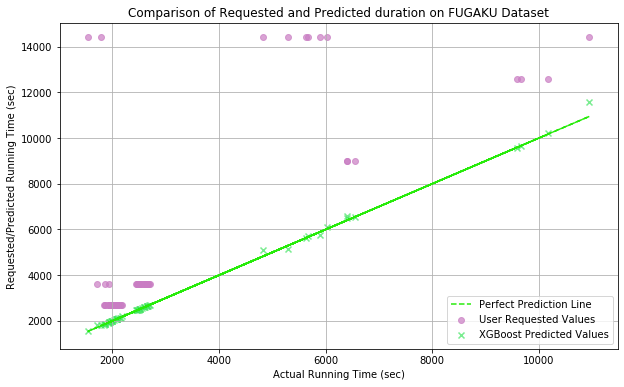

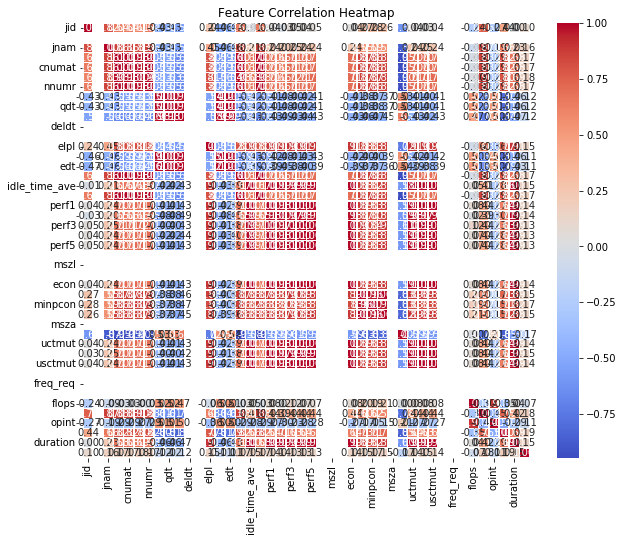

Top features for subgroup 23 (User Grouping): ['idle_time_ave', 'perf2', 'perf1', 'uctmut', 'usctmut']


/project/peaclab-mon/monitoring_venv/lib/python3.6/site-packages/ipykernel_launcher.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/project/peaclab-mon/monitoring_venv/lib/python3.6/site-packages/matplotlib/cbook/__init__.py:1402: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  x[:, None]
/project/peaclab-mon/monitoring_venv/lib/python3.6/site-packages/matplotlib/axes/_base.py:276: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  x = x[:, np.newaxis]
/project/peaclab-mon/mon

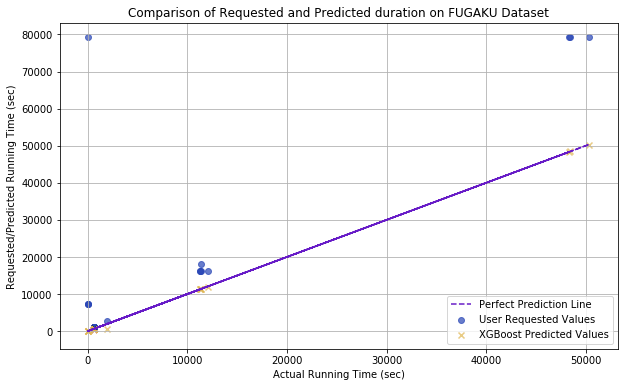

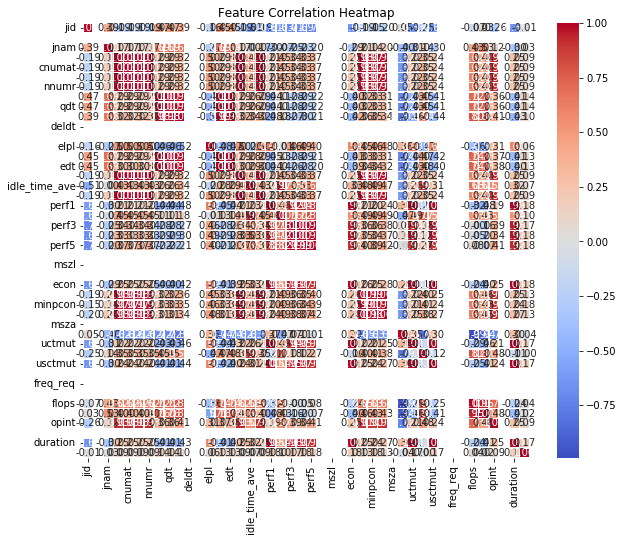

Top features for subgroup 24 (User Grouping): ['usctmut', 'econ', 'uctmut', 'perf1', 'perf4']


/project/peaclab-mon/monitoring_venv/lib/python3.6/site-packages/ipykernel_launcher.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/project/peaclab-mon/monitoring_venv/lib/python3.6/site-packages/matplotlib/cbook/__init__.py:1402: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  x[:, None]
/project/peaclab-mon/monitoring_venv/lib/python3.6/site-packages/matplotlib/axes/_base.py:276: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  x = x[:, np.newaxis]
/project/peaclab-mon/mon

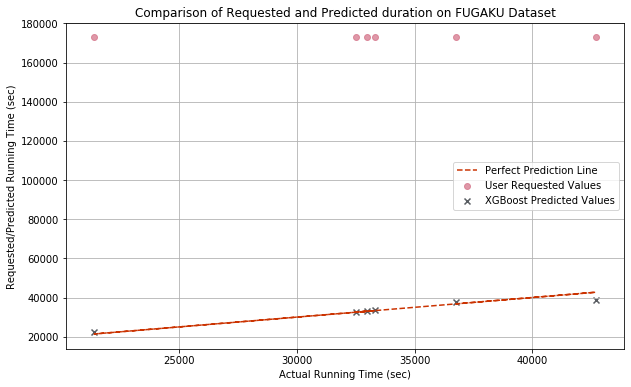

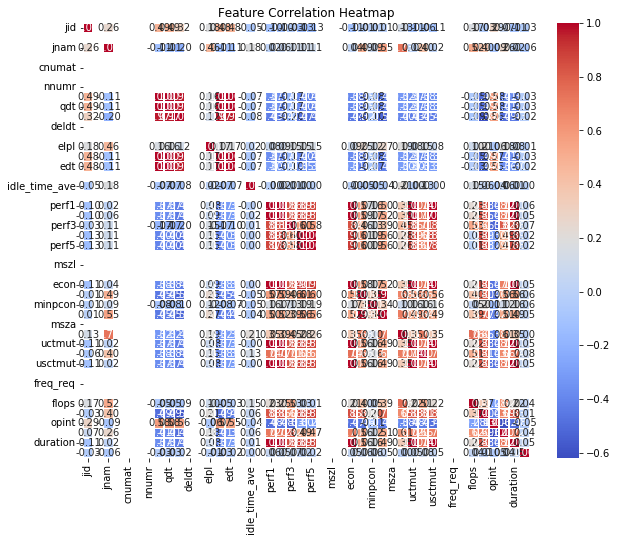

Top features for subgroup 25 (User Grouping): ['usctmut', 'uctmut', 'perf1', 'econ', 'perf2']


/project/peaclab-mon/monitoring_venv/lib/python3.6/site-packages/ipykernel_launcher.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/project/peaclab-mon/monitoring_venv/lib/python3.6/site-packages/matplotlib/cbook/__init__.py:1402: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  x[:, None]
/project/peaclab-mon/monitoring_venv/lib/python3.6/site-packages/matplotlib/axes/_base.py:276: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  x = x[:, np.newaxis]
/project/peaclab-mon/mon

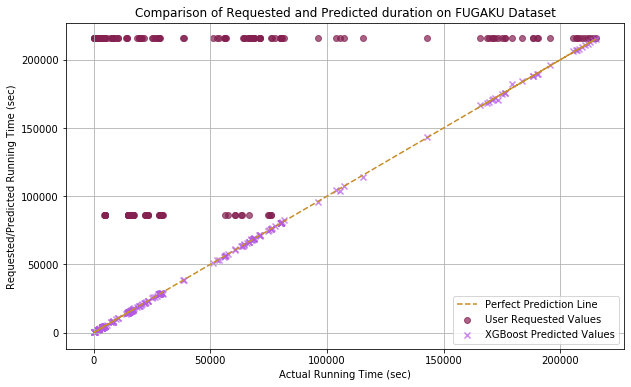

KeyboardInterrupt: 

In [14]:
start_time = time.time()
user_method_train(fugaku_df, 'FUGAKU Dataset', 'duration', 'usr', 'elpl', top_n=5)

end_time = time.time()

elapsed_time = end_time - start_time
print(f"User-based method took {elapsed_time:.2f} seconds to execute.")

In [ ]:
start_time = time.time()

value_method_train(fugaku_df, 'FUGAKU Dataset', 'duration', 'elpl', num_groups=10, top_n=5)

end_time = time.time()

elapsed_time = end_time - start_time
print(f"Value method took {elapsed_time:.2f} seconds to execute.")

/project/peaclab-mon/monitoring_venv/lib/python3.6/site-packages/pandas/core/frame.py:4389: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  method=method,
/project/peaclab-mon/monitoring_venv/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


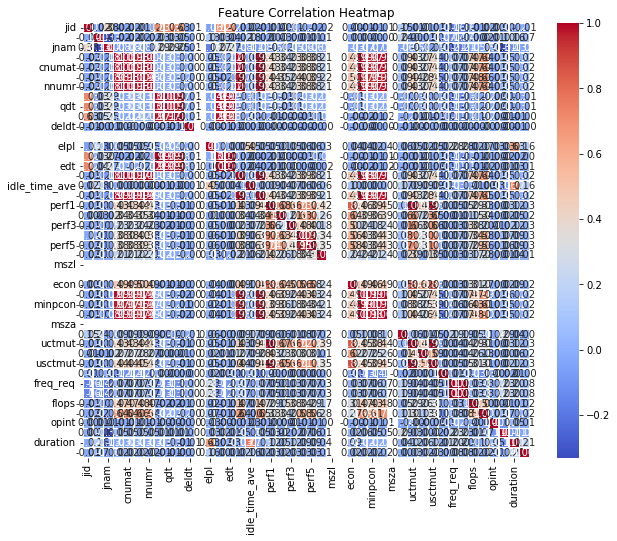

Top features for subgroup 1 (Clustering): ['idle_time_ave', 'elpl', 'lagged_target', 'freq_req', 'freq_alloc']


/project/peaclab-mon/monitoring_venv/lib/python3.6/site-packages/matplotlib/cbook/__init__.py:1402: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  x[:, None]
/project/peaclab-mon/monitoring_venv/lib/python3.6/site-packages/matplotlib/axes/_base.py:276: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  x = x[:, np.newaxis]
/project/peaclab-mon/monitoring_venv/lib/python3.6/site-packages/matplotlib/axes/_base.py:278: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  y = y[:, np.newaxis]


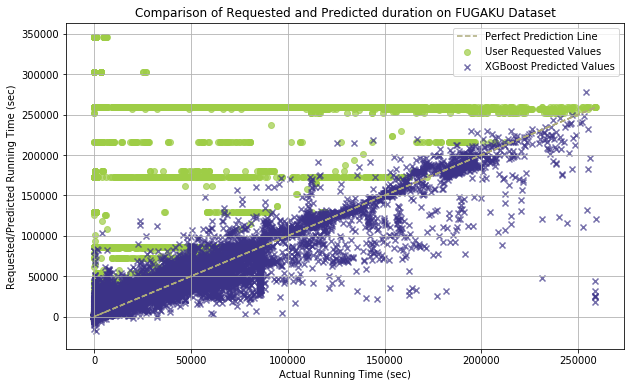

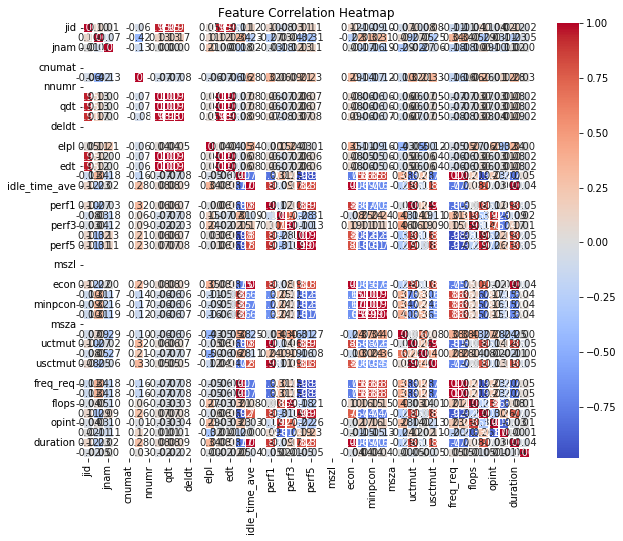

Top features for subgroup 2 (Clustering): ['idle_time_ave', 'econ', 'perf1', 'uctmut', 'perf5']


/project/peaclab-mon/monitoring_venv/lib/python3.6/site-packages/matplotlib/cbook/__init__.py:1402: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  x[:, None]
/project/peaclab-mon/monitoring_venv/lib/python3.6/site-packages/matplotlib/axes/_base.py:276: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  x = x[:, np.newaxis]
/project/peaclab-mon/monitoring_venv/lib/python3.6/site-packages/matplotlib/axes/_base.py:278: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  y = y[:, np.newaxis]


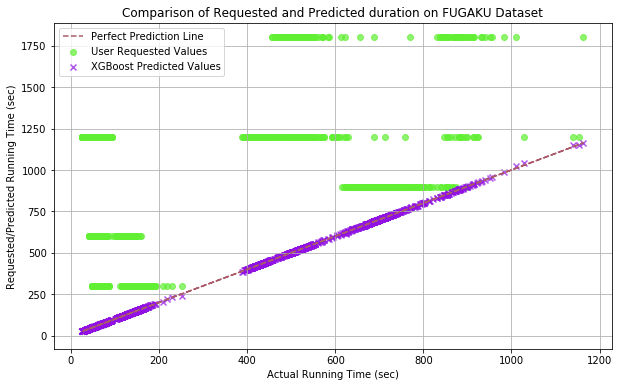

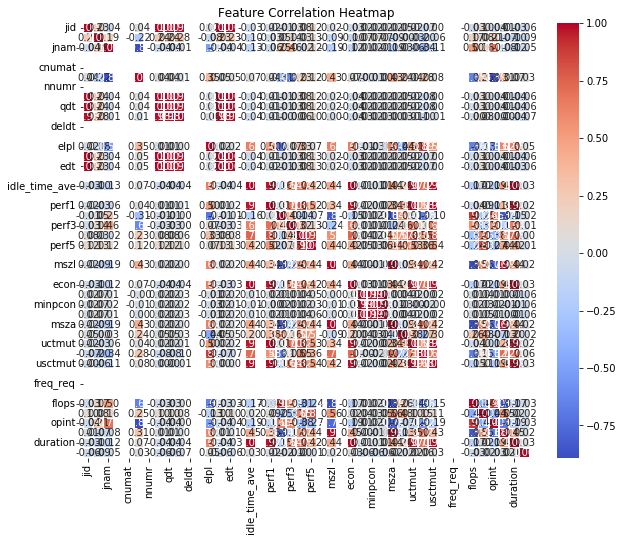

Top features for subgroup 3 (Clustering): ['idle_time_ave', 'econ', 'usctmut', 'perf1', 'uctmut']


/project/peaclab-mon/monitoring_venv/lib/python3.6/site-packages/matplotlib/cbook/__init__.py:1402: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  x[:, None]
/project/peaclab-mon/monitoring_venv/lib/python3.6/site-packages/matplotlib/axes/_base.py:276: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  x = x[:, np.newaxis]
/project/peaclab-mon/monitoring_venv/lib/python3.6/site-packages/matplotlib/axes/_base.py:278: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  y = y[:, np.newaxis]


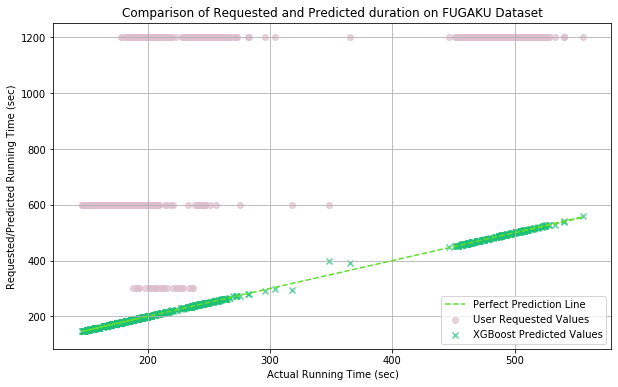

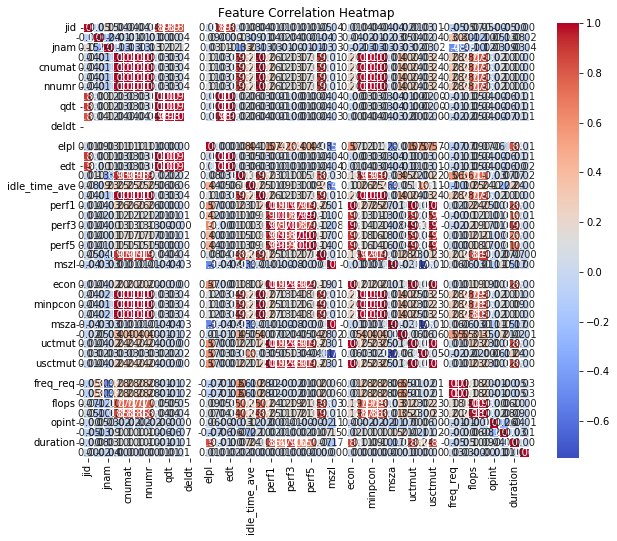

Top features for subgroup 4 (Clustering): ['perf3', 'econ', 'usctmut', 'uctmut', 'perf1']


/project/peaclab-mon/monitoring_venv/lib/python3.6/site-packages/matplotlib/cbook/__init__.py:1402: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  x[:, None]
/project/peaclab-mon/monitoring_venv/lib/python3.6/site-packages/matplotlib/axes/_base.py:276: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  x = x[:, np.newaxis]
/project/peaclab-mon/monitoring_venv/lib/python3.6/site-packages/matplotlib/axes/_base.py:278: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  y = y[:, np.newaxis]


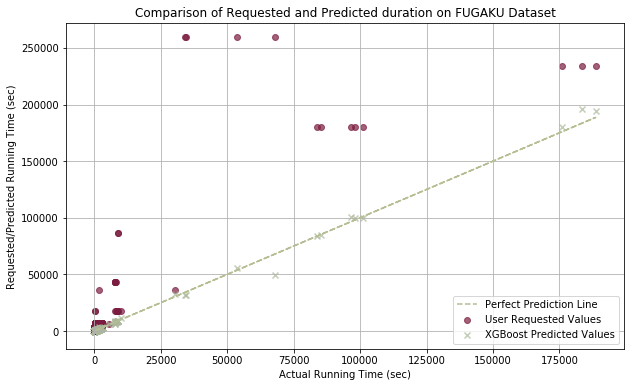

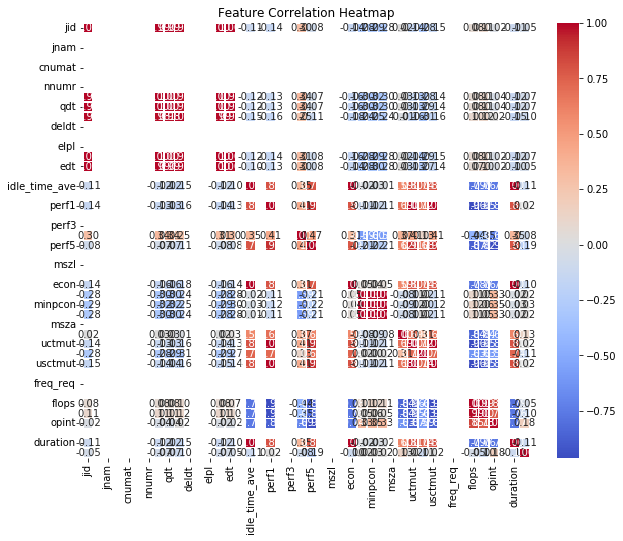

Top features for subgroup 5 (Clustering): ['idle_time_ave', 'econ', 'usctmut', 'perf1', 'uctmut']


/project/peaclab-mon/monitoring_venv/lib/python3.6/site-packages/matplotlib/cbook/__init__.py:1402: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  x[:, None]
/project/peaclab-mon/monitoring_venv/lib/python3.6/site-packages/matplotlib/axes/_base.py:276: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  x = x[:, np.newaxis]
/project/peaclab-mon/monitoring_venv/lib/python3.6/site-packages/matplotlib/axes/_base.py:278: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  y = y[:, np.newaxis]


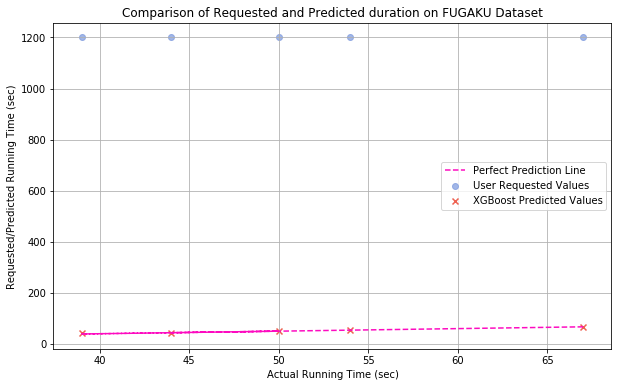

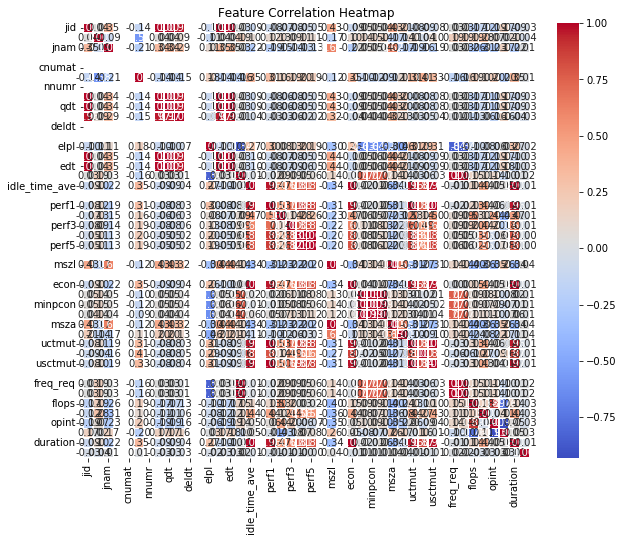

Top features for subgroup 6 (Clustering): ['idle_time_ave', 'econ', 'usctmut', 'uctmut', 'perf1']


/project/peaclab-mon/monitoring_venv/lib/python3.6/site-packages/matplotlib/cbook/__init__.py:1402: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  x[:, None]
/project/peaclab-mon/monitoring_venv/lib/python3.6/site-packages/matplotlib/axes/_base.py:276: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  x = x[:, np.newaxis]
/project/peaclab-mon/monitoring_venv/lib/python3.6/site-packages/matplotlib/axes/_base.py:278: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  y = y[:, np.newaxis]


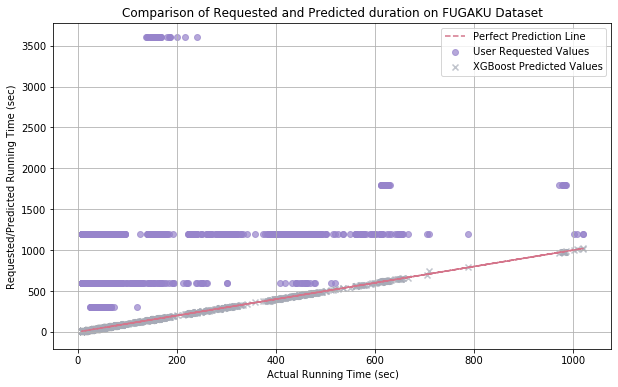

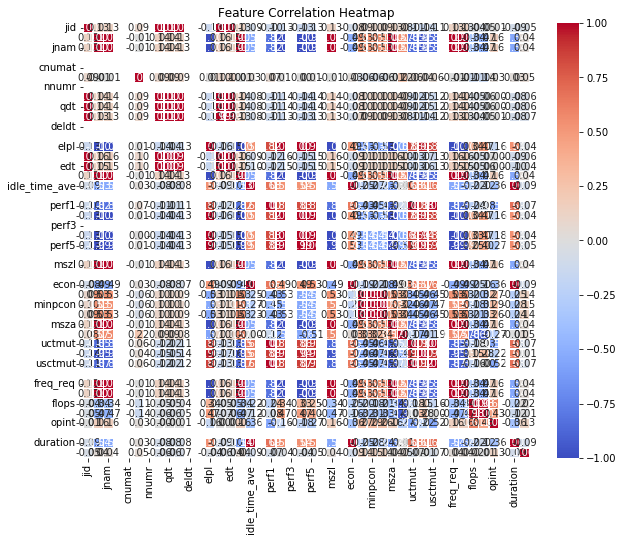

Top features for subgroup 7 (Clustering): ['idle_time_ave', 'econ', 'perf1', 'uctmut', 'usctmut']


/project/peaclab-mon/monitoring_venv/lib/python3.6/site-packages/matplotlib/cbook/__init__.py:1402: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  x[:, None]
/project/peaclab-mon/monitoring_venv/lib/python3.6/site-packages/matplotlib/axes/_base.py:276: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  x = x[:, np.newaxis]
/project/peaclab-mon/monitoring_venv/lib/python3.6/site-packages/matplotlib/axes/_base.py:278: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  y = y[:, np.newaxis]


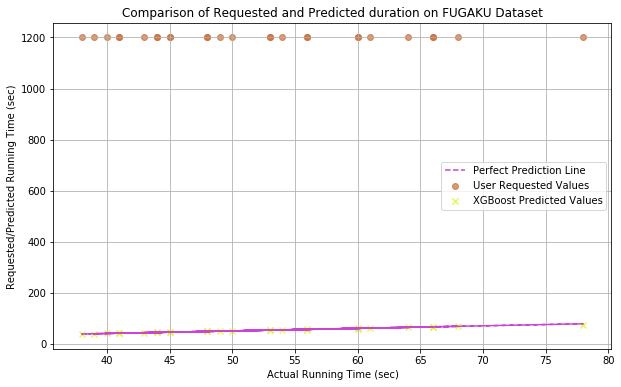

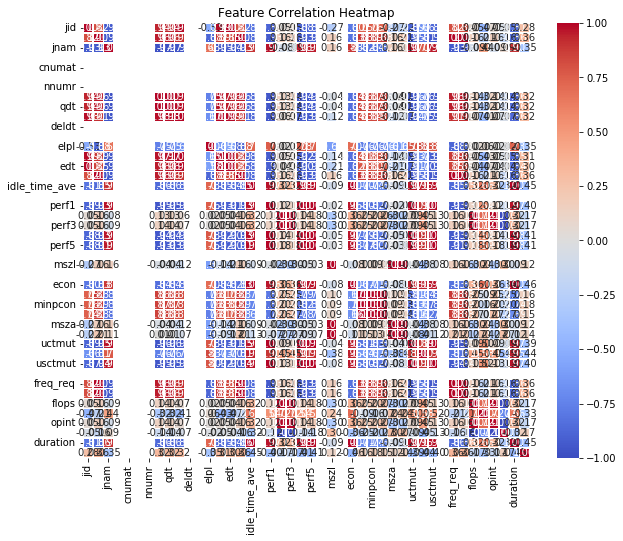

Top features for subgroup 8 (Clustering): ['idle_time_ave', 'econ', 'perf5', 'perf4', 'usctmut']


/project/peaclab-mon/monitoring_venv/lib/python3.6/site-packages/matplotlib/cbook/__init__.py:1402: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  x[:, None]
/project/peaclab-mon/monitoring_venv/lib/python3.6/site-packages/matplotlib/axes/_base.py:276: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  x = x[:, np.newaxis]
/project/peaclab-mon/monitoring_venv/lib/python3.6/site-packages/matplotlib/axes/_base.py:278: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  y = y[:, np.newaxis]


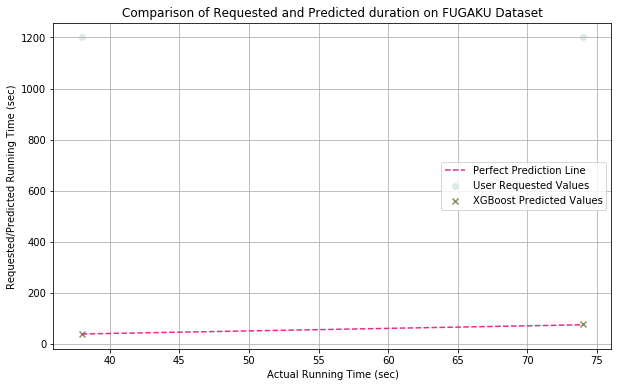

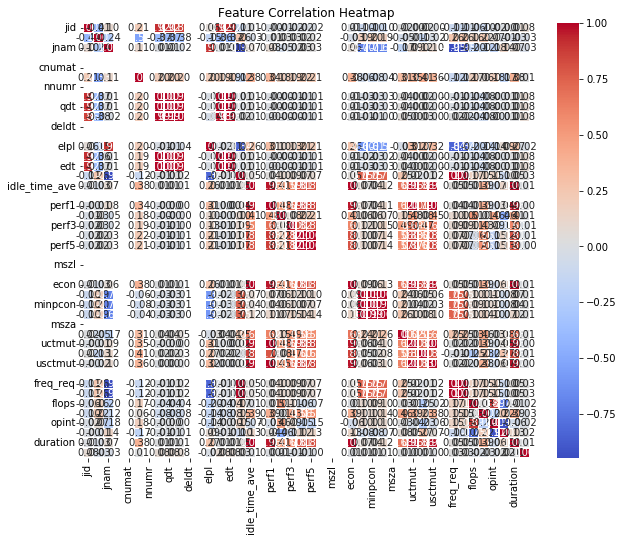

Top features for subgroup 9 (Clustering): ['idle_time_ave', 'econ', 'usctmut', 'uctmut', 'perf1']


/project/peaclab-mon/monitoring_venv/lib/python3.6/site-packages/matplotlib/cbook/__init__.py:1402: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  x[:, None]
/project/peaclab-mon/monitoring_venv/lib/python3.6/site-packages/matplotlib/axes/_base.py:276: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  x = x[:, np.newaxis]
/project/peaclab-mon/monitoring_venv/lib/python3.6/site-packages/matplotlib/axes/_base.py:278: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  y = y[:, np.newaxis]


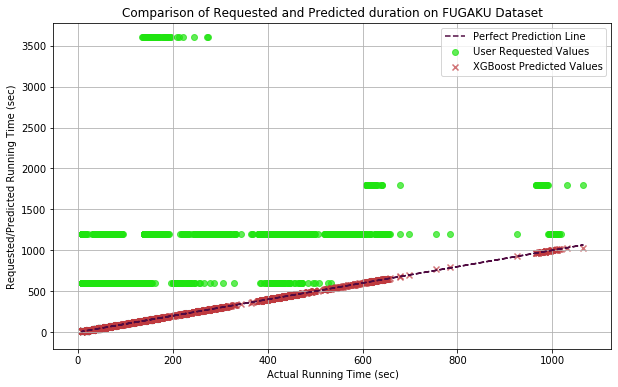

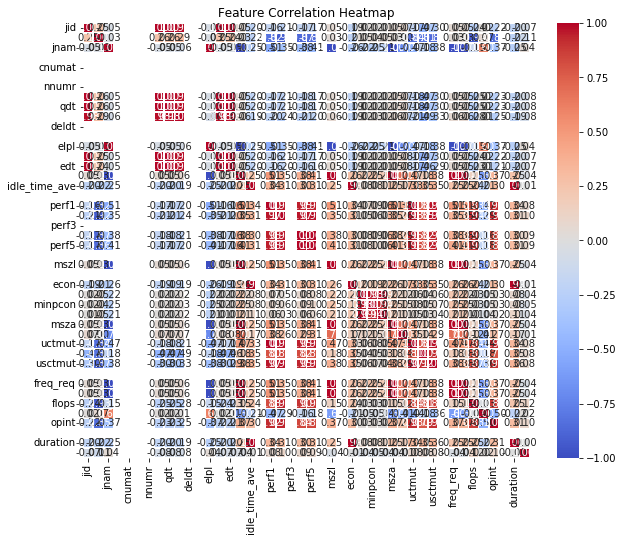

Top features for subgroup 10 (Clustering): ['idle_time_ave', 'econ', 'usctmut', 'sctmut', 'perf1']


/project/peaclab-mon/monitoring_venv/lib/python3.6/site-packages/matplotlib/cbook/__init__.py:1402: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  x[:, None]
/project/peaclab-mon/monitoring_venv/lib/python3.6/site-packages/matplotlib/axes/_base.py:276: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  x = x[:, np.newaxis]
/project/peaclab-mon/monitoring_venv/lib/python3.6/site-packages/matplotlib/axes/_base.py:278: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  y = y[:, np.newaxis]


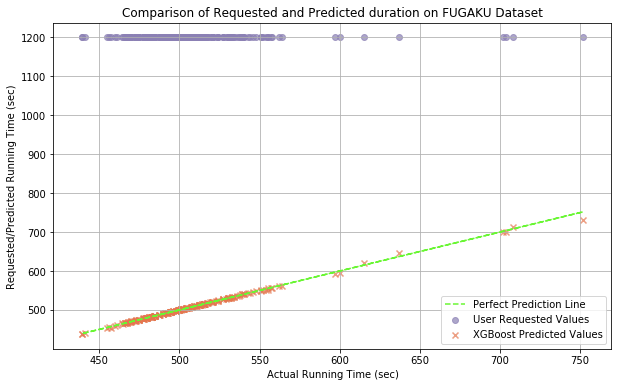

Average RMSE for Clustering: 905.3402
Cluster method took 70.81 seconds to execute.


In [15]:
start_time = time.time()

cluster_method_train(fugaku_df, 'FUGAKU Dataset',['jid', 'usr', 'jnam', 'elpl','mszl', 'cnumr', 'nnumr', 'jobenv_req', 'freq_req'], 'duration', 'elpl', num_groups=10, top_n=5)

end_time = time.time()

elapsed_time = end_time - start_time
print(f"Cluster method took {elapsed_time:.2f} seconds to execute.")


In [16]:
mse = mean_squared_error(fugaku_df['duration'], fugaku_df['elpl'])
rmse = np.sqrt(mse)
print(f"Root Mean Squared Error (RMSE): {rmse}")
    

Root Mean Squared Error (RMSE): 68624.15590300859


In [ ]:
start_time = time.time()
single_model_train(fugaku_df, 'FUGAKU Dataset', 'cnumut','cnumr', num_groups=10, top_n=5)

end_time = time.time()

elapsed_time = end_time - start_time
print(f"Single model took {elapsed_time:.2f} seconds to execute.")

In [ ]:
start_time = time.time()
user_method_train(fugaku_df, 'FUGAKU Dataset', 'cnumut', 'usr', 'cnumr', top_n=5)

end_time = time.time()

elapsed_time = end_time - start_time
print(f"User-based method took {elapsed_time:.2f} seconds to execute.")

In [ ]:
start_time = time.time()
value_method_train(fugaku_df, 'FUGAKU Dataset', 'cnumut', 'cnumr', num_groups=10, top_n=5)

end_time = time.time()

elapsed_time = end_time - start_time
print(f"Value method took {elapsed_time:.2f} seconds to execute.")


In [ ]:
start_time = time.time()
cluster_method_train(fugaku_df, 'FUGAKU Dataset',['jid', 'usr', 'jnam', 'elpl','mszl', 'cnumr', 'nnumr', 'jobenv_req', 'freq_req'], 'cnumut', 'cnumr', num_groups=10, top_n=5)

end_time = time.time()

elapsed_time = end_time - start_time
print(f"Cluster method took {elapsed_time:.2f} seconds to execute.")

In [ ]:
mse = mean_squared_error(fugaku_df['cnumut'], fugaku_df['cnumr'])
rmse = np.sqrt(mse)
print(f"Root Mean Squared Error (RMSE): {rmse}")

In [ ]:
start_time = time.time()
single_model_train(fugaku_df, 'FUGAKU Dataset', 'nnumu', 'nnumr', num_groups=10, top_n=5)

end_time = time.time()

elapsed_time = end_time - start_time
print(f"Single model took {elapsed_time:.2f} seconds to execute.")

In [ ]:
start_time = time.time()
user_method_train(fugaku_df, 'FUGAKU Dataset', 'nnumu', 'usr', 'nnumr', top_n=5)

end_time = time.time()

elapsed_time = end_time - start_time
print(f"User-based method took {elapsed_time:.2f} seconds to execute.")

In [ ]:
start_time = time.time()
value_method_train(fugaku_df, 'FUGAKU Dataset', 'nnumu', 'nnumr', num_groups=10, top_n=5)

end_time = time.time()

elapsed_time = end_time - start_time
print(f"Value method took {elapsed_time:.2f} seconds to execute.")

In [ ]:
start_time = time.time()
cluster_method_train(fugaku_df, 'FUGAKU Dataset',['jid', 'usr', 'jnam', 'elpl','mszl', 'nnumu', 'nnumr', 'jobenv_req', 'freq_req'], 'nnumu', 'nnumr', num_groups=10, top_n=5)


end_time = time.time()

elapsed_time = end_time - start_time
print(f"Cluster method took {elapsed_time:.2f} seconds to execute.")



In [ ]:
mse = mean_squared_error(fugaku_df['nnumu'], fugaku_df['nnumr'])
rmse = np.sqrt(mse)
print(f"Root Mean Squared Error (RMSE): {rmse}")

In [ ]:
value_method_train(fugaku_df, 'FUGAKU Dataset', 'mmszu', 'mszl', num_groups=10, top_n=5)


In [ ]:
 
cluster_method_train(fugaku_df, 'FUGAKU Dataset',['jid', 'usr', 'jnam', 'elpl','mszl', 'nnumu', 'nnumr', 'jobenv_req', 'freq_req'], 'mmszu', 'mszl', num_groups=10, top_n=5)


In [ ]:
mse = mean_squared_error(fugaku_df['mmszu'], fugaku_df['mszl'])
rmse = np.sqrt(mse)
print(f"Root Mean Squared Error (RMSE): {rmse}")

# M100 Cineca Dataset

In [ ]:
directory = '/projectnb/peaclab-mon/boztop/resource-allocation/datasets/m100/21_12_job_table/metric=job_info_marconi100/a_0.parquet'
df = pd.read_parquet(directory)

m100_df = df[df['job_state']=='COMPLETED']

m100_df


In [ ]:
def time_limit_to_seconds(time_limit_str):
    if '-' in time_limit_str:
        days, time_part = time_limit_str.split('-')
        time_parts = time_part.split(':')
        
        if len(time_parts) == 3:
            hours, minutes, seconds = map(int, time_parts)
        elif len(time_parts) == 2:
            hours, minutes = map(int, time_parts)
            seconds = 0
        else:
            raise ValueError(f"Invalid time format: {time_limit_str}")
        
        total_seconds = int(days) * 86400 + hours * 3600 + minutes * 60 + seconds
    else:
        time_parts = time_limit_str.split(':')
        
        if len(time_parts) == 3:
            hours, minutes, seconds = map(int, time_parts)
        elif len(time_parts) == 2:
            hours, minutes = map(int, time_parts)
            seconds = 0
        else:
            raise ValueError(f"Invalid time format: {time_limit_str}")
        
        total_seconds = hours * 3600 + minutes * 60 + seconds
    
    return total_seconds


m100_df['time_limit_sec'] = m100_df['time_limit_str'].apply(time_limit_to_seconds)
m100_df['submit_time'] = pd.to_datetime(m100_df['submit_time'], format='%Y:%m:%d %H')
m100_df['start_time'] = pd.to_datetime(m100_df['start_time'], format='%Y:%m:%d %H')
m100_df['end_time'] = pd.to_datetime(m100_df['end_time'], format='%Y:%m:%d %H')

m100_df['wait_time'] = (m100_df['start_time'] - m100_df['submit_time'])
m100_df['execution_time'] = (m100_df['end_time'] - m100_df['start_time'])

m100_df['wait_time'] = m100_df['wait_time'].dt.total_seconds()
m100_df['execution_time'] = m100_df['execution_time'].dt.total_seconds()




In [ ]:
for col in m100_df.select_dtypes(include=['object', 'category']).columns:
    print(f'Encoding the feature {col}')
    le = LabelEncoder()
    m100_df[col] = le.fit_transform(m100_df[col].astype(str))

In [ ]:
m100_rmse_vals = analyze_and_train(m100_df, 'M100 Dataset','execution_time', 'user_id', 'time_limit_sec', num_groups=2, top_n=5)
    
print(m100_rmse_vals)    


# Google Cluster Dataset

In [ ]:
file_path = '/projectnb/peaclab-mon/boztop/resource-allocation/datasets/borg_traces_data.csv'

df = pd.read_csv(file_path)

google_df = df[df['failed'] == 0]
google_df['start_time'] = google_df['start_time'].astype(int)
google_df['time'] = google_df['time'].astype(int)
google_df = google_df.sort_values(by='start_time').reset_index(drop=True)

google_df['resource_request'] = google_df['resource_request'].apply(
    lambda x: ast.literal_eval(x) if isinstance(x, str) else x if isinstance(x, dict) else None
)
google_df['maximum_usage'] = google_df['maximum_usage'].apply(
    lambda x: ast.literal_eval(x) if isinstance(x, str) else x if isinstance(x, dict) else None
)

google_df['cpu_req'] = google_df['resource_request'].apply(lambda x: x['cpus'] if isinstance(x, dict) else None)
google_df['mem_req'] = google_df['resource_request'].apply(lambda x: x['memory'] if isinstance(x, dict) else None)
google_df['cpu_used'] = google_df['maximum_usage'].apply(lambda x: x['cpus'] if isinstance(x, dict) else None)
google_df['mem_used'] = google_df['maximum_usage'].apply(lambda x: x['memory'] if isinstance(x, dict) else None)

google_df = google_df.drop(columns=['resource_request', 'maximum_usage'])


print(google_df.columns)
google_df

In [ ]:
google_rmse_vals = analyze_and_train(google_df, 'Google Cluster Dataset CPU Cores', 'cpu_used', 'usr', 'cpu_req')
    
print(google_rmse_vals)  
 

    

In [ ]:
cpu_used = google_df['cpu_used'].replace([np.inf, -np.inf], np.nan).dropna()
cpu_req = google_df['cpu_req'].replace([np.inf, -np.inf], np.nan).dropna()

aligned = cpu_used.align(cpu_req, join='inner')
cpu_used, cpu_req = aligned[0], aligned[1]

errors = cpu_used - cpu_req
mse = np.mean(errors ** 2)  # Mean Squared Error
rmse = np.sqrt(mse)         # Root Mean Squared Error

print(f"Root Mean Squared Error (RMSE): {rmse}")



In [ ]:
google_rmse_vals = analyze_and_train(google_df, 'Google Cluster Dataset CPU Cores', 'mem_used', 'usr', 'mem_req')
    
print(google_rmse_vals)  
 

    

In [ ]:
cpu_used = google_df['mem_used'].replace([np.inf, -np.inf], np.nan).dropna()
cpu_req = google_df['mem_req'].replace([np.inf, -np.inf], np.nan).dropna()

aligned = cpu_used.align(cpu_req, join='inner')
cpu_used, cpu_req = aligned[0], aligned[1]

errors = cpu_used - cpu_req
mse = np.mean(errors ** 2)  # Mean Squared Error
rmse = np.sqrt(mse)         # Root Mean Squared Error

print(f"Root Mean Squared Error (RMSE): {rmse}")

